In [ ]:
import pandas as pd
import numpy as np

import re

import string

import math

import matplotlib.pyplot as plt

In [6]:
pd.set_option("display.max_columns", 24)
df=pd.read_csv("D:/python/A Beginner’s Guide to Exploratory Data Analysis (EDA) on Text Data (Amazon Case Study)/1429_1.csv")
df.head(2)

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (1,10) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,id,name,asins,brand,categories,keys,manufacturer,reviews.date,reviews.dateAdded,reviews.dateSeen,reviews.didPurchase,reviews.doRecommend,reviews.id,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username
0,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",NaN,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,This product so far has not disappointed. My c...,Kindle,NaN,NaN,Adapter
1,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",NaN,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,great for beginner or experienced person. Boug...,very fast,NaN,NaN,truman


# Text Data Pre-processing

In [7]:
df.shape

(34660, 21)

In [8]:
df=df[["name","reviews.text","reviews.doRecommend","reviews.numHelpful"]]
df

,name,reviews.text,reviews.doRecommend,reviews.numHelpful
0,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",This product so far has not disappointed. My c...,True,0.0
1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",great for beginner or experienced person. Boug...,True,0.0
2,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",Inexpensive tablet for him to use and learn on...,True,0.0
3,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",I've had my Fire HD 8 two weeks now and I love...,True,0.0
4,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",I bought this for my grand daughter when she c...,True,0.0
...,...,...,...,...
34655,NaN,This is not appreciably faster than any other ...,NaN,NaN
34656,NaN,Amazon should include this charger with the Ki...,NaN,NaN
34657,NaN,Love my Kindle Fire but I am really disappoint...,NaN,NaN
34658,NaN,I was surprised to find it did not come with a...,NaN,NaN


df.isnull()

In [9]:
df.isna().sum()

name                   6760
reviews.text              1
reviews.doRecommend     594
reviews.numHelpful      529
dtype: int64

In [10]:
df.dropna(inplace=True)
df.isnull().sum()

name                   0
reviews.text           0
reviews.doRecommend    0
reviews.numHelpful     0
dtype: int64

considering those products that have at least 500 reviews

In [11]:
df=df.groupby("name").filter(lambda x:len(x)>500).reset_index(drop=True)
df

,name,reviews.text,reviews.doRecommend,reviews.numHelpful
0,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",This product so far has not disappointed. My c...,True,0.0
1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",great for beginner or experienced person. Boug...,True,0.0
2,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",Inexpensive tablet for him to use and learn on...,True,0.0
3,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",I've had my Fire HD 8 two weeks now and I love...,True,0.0
4,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",I bought this for my grand daughter when she c...,True,0.0
...,...,...,...,...
26063,"Amazon Fire Tv,,,\r\nAmazon Fire Tv,,,","It has many uses. You can listen to music, che...",True,0.0
26064,"Amazon Fire Tv,,,\r\nAmazon Fire Tv,,,","Cost is not outrageous. Easy setup, fun to use...",True,0.0
26065,"Amazon Fire Tv,,,\r\nAmazon Fire Tv,,,",I knew about this from its crowd funding start...,True,1.0
26066,"Amazon Fire Tv,,,\r\nAmazon Fire Tv,,,",This is a neat product but did not fit my need...,False,0.0


In [12]:
print("Number of products", df["name"].nunique())

Number of products 8


In [13]:
df["reviews.doRecommend"]=df["reviews.doRecommend"].astype(int)
df["reviews.doRecommend"]

0        1
1        1
2        1
3        1
4        1
        ..
26063    1
26064    1
26065    1
26066    0
26067    1
Name: reviews.doRecommend, Length: 26068, dtype: int32

In [14]:
df["reviews.numHelpful"]=df["reviews.numHelpful"].astype(int)
df["reviews.numHelpful"]

0        0
1        0
2        0
3        0
4        0
        ..
26063    0
26064    0
26065    1
26066    0
26067    0
Name: reviews.numHelpful, Length: 26068, dtype: int32

In [15]:
df["name"].unique()

array(['All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta',
       'Fire Tablet, 7 Display, Wi-Fi, 8 GB - Includes Special Offers, Magenta',
       'Brand New Amazon Kindle Fire 16gb 7 Ips Display Tablet Wifi 16 Gb Blue,,,',
       'Fire Kids Edition Tablet, 7 Display, Wi-Fi, 16 GB, Green Kid-Proof Case',
       'Amazon Kindle Paperwhite - eBook reader - 4 GB - 6 monochrome Paperwhite - touchscreen - Wi-Fi - black,,,',
       'Kindle Voyage E-reader, 6 High-Resolution Display (300 ppi) with Adaptive Built-in Light, PagePress Sensors, Wi-Fi - Includes Special Offers,',
       'Echo (White),,,\r\nEcho (White),,,',
       'Amazon Fire Tv,,,\r\nAmazon Fire Tv,,,'], dtype=object)

In [16]:
df["name"]=df["name"].apply(lambda x: x.split(",,,")[0])
df["name"].unique()

array(['All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta',
       'Fire Tablet, 7 Display, Wi-Fi, 8 GB - Includes Special Offers, Magenta',
       'Brand New Amazon Kindle Fire 16gb 7 Ips Display Tablet Wifi 16 Gb Blue',
       'Fire Kids Edition Tablet, 7 Display, Wi-Fi, 16 GB, Green Kid-Proof Case',
       'Amazon Kindle Paperwhite - eBook reader - 4 GB - 6 monochrome Paperwhite - touchscreen - Wi-Fi - black',
       'Kindle Voyage E-reader, 6 High-Resolution Display (300 ppi) with Adaptive Built-in Light, PagePress Sensors, Wi-Fi - Includes Special Offers,',
       'Echo (White)', 'Amazon Fire Tv'], dtype=object)

taking a look at some product reviews from the dataset:


In [17]:
for index, text in enumerate(df["reviews.text"]):
    print(f"Review {index+1}: \n",text)

Review 1: 
 This product so far has not disappointed. My children love to use it and I like the ability to monitor control what content they see with ease.
Review 2: 
 great for beginner or experienced person. Bought as a gift and she loves it
Review 3: 
 Inexpensive tablet for him to use and learn on, step up from the NABI. He was thrilled with it, learn how to Skype on it already...
Review 4: 
 I've had my Fire HD 8 two weeks now and I love it. This tablet is a great value.We are Prime Members and that is where this tablet SHINES. I love being able to easily access all of the Prime content as well as movies you can download and watch laterThis has a 1280/800 screen which has some really nice look to it its nice and crisp and very bright infact it is brighter then the ipad pro costing $900 base model. The build on this fire is INSANELY AWESOME running at only 7.7mm thick and the smooth glossy feel on the back it is really amazing to hold its like the futuristic tab in ur hands.
Review

Review 933: 
 i really love this product because it lets me read books and surf the net
Review 934: 
 Love this tablet. Bought it to be my touch screen remote for my harmony hub, but use it for so much more now.
Review 935: 
 make sure you buy a micro sd card with at least 64 gb of memory. or you will have to constantly delete old items.
Review 936: 
 This is a good product but the one I bought stops working after three or four typed sentences and the Geek Squad guy told me when I brought it back that I had to go into settings and clear the data when it does that. WRONG ANSWER. That should never have to be done. He had no idea what he was doing and North Haven Best Buy didn't offer to fix or replace my Kindle. This is the third product I have had to go back and either return or exchange because it wasn't working properly or at all. One manager tried to excuse the store by asking me if I understand Best Buy doesn't actually manufacture these products. If that is the best they can do to 

 Works well but lacks forward control of screen and right and left movement on keyboard. Good foor short notes but could never do any substantial typing on this without external keyboard. Good for basic websurfing and email.
Review 1433: 
 The 8" version is much better than the older 7" version. Better graphics and faster processor
Review 1434: 
 Better then a E-book, more options and versatility
Review 1435: 
 I haven't used a product like this and man I have to tell u it's better than apple products
Review 1436: 
 This was exactly as advertised and did everything that was claimed. Setup was fast and easy and I have no complaints.
Review 1437: 
 Love this tablet for streaming, facebook, games and general web surfing. The apps are available on the amazon underground, not google playstore, so some apps that you may be used to using, may not be available on amazon underground. Overall, great tablet for the price. Would recommend.
Review 1438: 
 The screen is vibrant and clear. It is fast

Review 2082: 
 This was the perfect tablet for my wife for Christmas, she loves it. Easy to navigate and plenty of room for her favorites!
Review 2083: 
 Size, brightness, and convenience are good. The option to link with android products for messages is a little hard.
Review 2084: 
 I bought this for Christmas and my 10 year old loves it!!!!!!!!!!!!!!
Review 2085: 
 I need a tablet to begin exploring google and kindle fire was a great choice.
Review 2086: 
 Got this tablet for my mom who isn't very tech savvy. She loves it. Can't beat the price
Review 2087: 
 I am very impressed with this tablet. It is faster than some iPads I have used. I gave this as a gift and my Mother-in-law loves it. Thank you
Review 2088: 
 Hands down a great update to my first gen Kindle. Worthwhile!
Review 2089: 
 Cheaper than the paper white and has more abilities
Review 2090: 
 I bought this to replace an older model and am very happy with the product. Mostly used for reading but also for surfing the web, f

 Got this tablet for my mother and liked it so much that I went and got one for myself! It runs fast for what I use it for!
Review 2683: 
 I bought this tablet for my 13 yr. old God-child and she loves it. This was her Christmas present.
Review 2684: 
 Bought it for my wife she loves it and I would but one for my self too
Review 2685: 
 Excellent value, great product. It has a really solid feel. I am very happy with the purchase.
Review 2686: 
 Have had a nook and this is easier to use and greater variety of uses and I greatly prefer it.
Review 2687: 
 Great apps,ease of use,love the 8in screen, camera not that great, better pics on phones
Review 2688: 
 this a great tablet, my grandaughter uses the kindle settings for her little girl who is in pre school
Review 2689: 
 This is an upgrade we purchased for Mom. She was able to use it with no problem. Alot like her previous Kindle
Review 2690: 
 Very happy with the Kindle tablet! Bought it to replace an old Kindle tablet. Great tablet, s

Review 3432: 
 Not the greatest for productivity but it's very good at entertaining kids at a cheap price.
Review 3433: 
 I can't get my tablet to set the time so I haven't been able to even use it a little disappointed with this purchase no instructions came with it!!
Review 3434: 
 I bought it for my mom and it is perfect. It recharges quickly and was very cheap and effective. Nothing fancy but sturdy and gets the job done, like the San Antonio spurs.
Review 3435: 
 Sometimes the screen is not as responsive as I would like it to be but it does what we need it to do and our daughter loves it.
Review 3436: 
 It was for my niece she absolutely loves pink. And has been playing it since I gave it to her
Review 3437: 
 Stopped working after only a year. Felt flimsy. Did like that I could upload Amazon books
Review 3438: 
 Git this tablet for my daughter. She is loving it!
Review 3439: 
 I bought this for my niece and nephew and they love it!
Review 3440: 
 The quality is great with an affo

 I picked this up during Black Friday and managed to get it cheaper than MSRP. My girlfriend and I have it in the living room to pick up and use whenever another screen is occupied by something else. It's very useful, and since we weren't looking for anything with deep features, it was well worth the price.
Review 4144: 
 I bought this for myself on Black Friday and am very pleased. For a FIFTY DOLLAR tablet, it has a great display and battery life. It's capabilities are below many system requirements of applications and games meaning they may not run at all or if they do, poorly. That's fine for my needs as apps/games aren't my focus. If you're buying a tablet for games/apps I would recommend looking past the Amazon tablets and over to full android os tablets or ipads as the google play and apple app store have muchhh more options. In that case, it definitely is worth it to spend more for tablet capabilities.I use my amazon fire 7" tablet for reading, searching the internet, shopping 

 This is a great Kindle. It has great sound and clarity of the screen. Easy to use.
Review 4682: 
 I had got the original for the wife she finally needed a new one so when I saw this online I had to get her a new one she loves it
Review 4683: 
 I bought this as a mother's day gift for my mother. She has not had much experience with tablets. This was a perfect choice for her. Doesn't do anything. Crazy but works great for free to play games and kindle books and apps.
Review 4684: 
 We had purchased these same tablets for our kids for Christmas and we really liked them. I like that they have kindle unlimited. I don't constantly have to buy books, like with my Nook. $10 a month for unlimited and I can read all the books I want
Review 4685: 
 Perfect for the price. Great for kids to play games. Good battery life too!
Review 4686: 
 picked up this fire tablet for the simple reason of reading ebooks purchased through kindle rather than on my phone. it's small enough I can stash it in my bag 

Review 5349: 
 You can't beat $50 for a usable media consumption tablet. Play games or watch video without pauses or skips.
Review 5350: 
 Bought this at Best Buy since I had a $10 reward coupon so only sent $40 for this tablet. Short story this tablet can do everything your smart phone can do and I kinda like Amazon's new OS running on this tablet better than Android, nice clean interface and very user friendly also like the way categories are on top and you can swipe right to view them. As far as speed is concern this tablet is good, you can jump from apps with ease (although installing new apps are a bit slower than on Android) the apps have installed are Facebook,Linkedin, Overdrive, CNN, Pandora, Pinterest, Skpe all run fine. You can even run games on this $50 device, games like Sky Force, Real Racing 3 (these game have high graphics) run surprisingly smooth. Videos on Netflix, HBO Now, Pluto Tv and Youtube look great even though they are not HD. Sound is just ok (my smartphone so

 My granddaughter loves to play games on this tablet. At the same time she can look for information on internet for her school homework. Another think I like about it, is that you can use an sd card for extra storage. It's very user friendly!
Review 5875: 
 I bought the Amazon Fire thinking it was all that and it is as long as I am home with a strong wifi. It does not pick up wifi good the connection is very weak when I try to connect elsewhere like I have to be right near the box or it doesn't pick up. But I find that with my camera also an Amazon product. Ok so that may be the problem.
Review 5876: 
 We got this tablet for my aunt so she could read, check emails, and play games. It is very easy to setup and use for anyone!
Review 5877: 
 Easy to use and convenient when you need to check or look something up quickly. The low price was a good incentives to try this product.
Review 5878: 
 Amazon fire connected with Overdrive,Kindle and Amazon aidiobooks.
Review 5879: 
 Quality was good

 This is our family's 4th product of the same. All of us have one and they are lasting forever. Will never be without one.
Review 6431: 
 this was such a super deal i bought 2. they work very well and you could not beat the price. i would definately recommend to a friend
Review 6432: 
 The best remote for the price you cannot beat it, easy to use
Review 6433: 
 Got this to replace my son's cheaper tablet. It is well worth the extra money. He loves it.
Review 6434: 
 Overall a good tablet. The screen is crisp enough to enjoy videos. The only downside is the built in speakers. Even with headphones, the sound quality isn't top notch. Just average. If you're not looking to do anything fancy. It's a good deal.
Review 6435: 
 It's alright personally the picture quality is pretty bad but I guess that's what you get for paying 50.
Review 6436: 
 I wrote the review previously thinking it was the Amazon fire. Turned out it was the case I reviewed. The Amazon Fire is a great alternative to the ki

Review 7012: 
 This is my first kindle and I love it. Would highly recommend
Review 7013: 
 Just ok even for the low price of 33$. It's more like a toy than a tablet.
Review 7014: 
 Great size for children and travel! The kids proof case is a must!
Review 7015: 
 G'kids came over early for Christmas, ages 7 and 10. They opened basketball hoop and backboard, a camera, Lego toys BUT they went "CRAZY" when they opened the "FIRE" tablets. By the time they went home they had already downloaded game apps to play. Thanks for a great Christmas ...
Review 7016: 
 Love it, the tablet is nice lightweight you can use it everywhere!
Review 7017: 
 This was purchased as a gift for our Grandson. He is 8 yrs old and has played games on it almost constantly since receiving it. It has many free games available to play on it.
Review 7018: 
 I guess it's ok...All the apps are in need of updating. Amazon won't or can't update them. There help center did nothing.
Review 7019: 
 I bought the tablet for games

 For the price you cannot beat the deal on a tablet. Crystal clear picture and very fast. OK, so the wide variety of apps available on an apple or Android are not here. But most major apps are, and if the app is not available just go to their website. A simple fix.
Review 7595: 
 I am so glad i got this tablet i can take it with me anywhere and use anytime
Review 7596: 
 2nd kindle liked the first one better space bar located to close to change menu icons download is slow and have great internet service, device freezes up a lot and have to shut down and reboot, must close out any open tab to open a new one one happy with this model
Review 7597: 
 It works like expected. The photos are not as good as my cell phone but ok enough for the price
Review 7598: 
 Quality of screen display is lacking and the reason I returned the tablet. For adult users I cannot recommend.
Review 7599: 
 Durable and inexpensive. Just bought two to replace my kids' fires that were over 4 and 2 years old, respect

 It's a great tablet for everyone I would recommend.
Review 8169: 
 We bought the tablet for work, but the only app we needed (free) never would download. After many tries and several hours, we gave up and took it back to the store.
Review 8170: 
 I was buying tablets for two grandkids ages 5 and 10. These did the trick and I didn't have to spend a fortune. I also bought the protective cases to protect them...Great purchase!
Review 8171: 
 This replaced a gift from the past year that didn't come with an expansion slot. He was very happy to get this.
Review 8172: 
 Purchased for my son right before a family trip, This thing is great and packs all the features I could have asked for.
Review 8173: 
 Kindle fire 7 is a great affordable tablet has everthing i need.
Review 8174: 
 I loved the tablet...does what it suppose to do...
Review 8175: 
 I purchased a Samsung S7 and S7 Edge and they are even better than the previous phones I have owned.
Review 8176: 
 Gave it to my mom, who hasn't tu

 These are great tablets for anyone wanting to get into the tablet game. A friendly UI for just about anyone. Not to mention, for the price and being able to add an SD card for additional memory, makes this a great tablet.
Review 8620: 
 Easy inexpensive gift that you can rely on. Although i would rather have the Google play store as the main download application, it's Worth the money to buy for others.
Review 8621: 
 This is my son's 1st smart phone and so far, it does what he needs it to do.
Review 8622: 
 I buy this tablet for my kid for Christmas he really like it
Review 8623: 
 Did what its suppose to do my kid loves it. Amazon keep up the great work
Review 8624: 
 I purchased this for a Christmas gift to my niece she is learning a lot from it and it keeps her occupied with the games she loaded to it smart choice for first time tablet and its a great brand
Review 8625: 
 This product was very easy not only for my 7 and 8 year old nephews but it was rather easy for my 3 and 4 year 

 It does just what I need it to do! Easy to take on the go!
Review 9177: 
 ...but mind the quality control. For $40 - $50, you get an amazingly capable tablet for media consumption. Streaming services, surfing, and reading are all handled perfectly fine, however, the tablet lacks the power to be a gaming platform.Please note, this is actually my 3rd tablet, as the first 2 were returned with the first being covered in dead pixels and the second having terrible light bleed. The 3rd looked and functioned perfectly. Bad batch? Who knows. But watch the quality control.
Review 9178: 
 I purchased this tablet for my grandma and she was able to learn to use it right away. This is a great tablet for someone who is a beginner when it comes to technology.
Review 9179: 
 My kids love it. I think I will buy another one for myself. Holds a good charge, loud and pretty durable to be inexpensive.
Review 9180: 
 Bought this item for my grandson and now we both used it. Bright screen, good wifi connecti

Review 9532: 
 The new 7" Kindle Fire is an excellent product for the kids. The compact size makes it easy to travel with and the apps are great. Amazon hit a homerun with this one!
Review 9533: 
 Great price for an introductory tablet. Bought for my brother in law who is not tech savvy. He has loved it. Easy to use.
Review 9534: 
 Bought it for my 5 yr old grand daughter and she absolutely loves it! The Kidzobe package is the best
Review 9535: 
 I got this tablet for $35 on black Friday. Plenty of speed for surfing the web and playing games. The screen looks pretty good for budget tablet. My 4 year loves watching movies and playing free games with it and setting screen time limits and other parental controls make it a great buy.
Review 9536: 
 Great tablet. Easy to read the screen, fast. Great price.
Review 9537: 
 I got this for my mom. I have a Kindle and there are always free games available for it but not for the tablet she had so i got it for her and download a bunch of games for

 This is an excellent product especially for the price
Review 9963: 
 Bought this item on Black Friday and was going to give it as a gift but kept it for myself. Excellent value!
Review 9964: 
 Got this as a gift for my grandmother and loaded it with games for her. Simple to use and easy for her once my son showed her the basics.
Review 9965: 
 We bought 3 of these both our sons and our granddaughter LOVE then easy to operate so far no glitches sturdy and not so expensive I have to worry about the kids breaking them and not being able to replace
Review 9966: 
 I bought one of these on Black Friday on impulse since it was $34.99 and I had a $5 certificate to use. I have a third generation iPad and am quite accustomed to using it and the App Store.Pros: OS is Android based and not too hard to pick up compared to Apple. I did find versions of a lot of favorite apps and games to download. It can take up to 128GB microSD card for expanding storage (only 8 GB built in). I got a 64 GB class 1

 Bought this for my son, he really enjoys using it especially as an e-reader,
Review 10299: 
 This product is good for kids. Has options to put different users to have set up how each person wants it and can set parent controls.
Review 10300: 
 Bought this for my daughter and she loves it. Great tablet for the price!
Review 10301: 
 Love this product.It'sgreat for downloading and reading books on the go.
Review 10302: 
 Fairly small screen. But excellent for traveling. Portable and watch lots of movies. Camera isn't great quality but don't use it for that anyway.
Review 10303: 
 This was a gift for my 3 year old. I am so happy with my purchase. This try to keep some busy so I can now catch up with doing the things I loved.
Review 10304: 
 I love reading books on my Kindle. I don't know why I waited so long to buy one. I also enjoy using it to check e-mail, Facebook, and Messenger,etc.
Review 10305: 
 Works great greatest of the year and I love it and it is the best thing ever I want to

 Tablet does great for its price segment. Very resourcelful and fun for kids.
Review 10929: 
 Bought the Amazon Fire tablet to read books and brows the internet. Works well very happy,
Review 10930: 
 I got this tablet for my grand daughter and she loves it. She loves playing her princesses games on it. We even got most of her videis on it so she dont have to have internet to watch them.
Review 10931: 
 bought product for my 9yr old, it works fine for her,she is constantly on it and so far no compaints
Review 10932: 
 I think that for the price, this product is fantastic. It is more than acceptable for media consumption. I highly recommend it for those on a budget or need a secondary consumption device.
Review 10933: 
 Bought this for my dad and he loves it. He does not do anything too extreme just basic apps. And it handles multiple apps well and for only $50 it was a great value deal. Excellent for games and light activities.
Review 10934: 
 Purchased this for my older son to be able

 I bought this kindle before travelingin Asia for 6 weeks. I didn't want to bring any expensive electronics I case anything happened. This tablet did everything I hoped and more. It was perfect for reading and keeping in touch with people back home.
Review 11429: 
 Great, would recommend this to anyone!!! My husband will not put it down! He loves it! I also have one! The price a Best Buy was excellent!!!
Review 11430: 
 Excellent value and good WiFi access Video quality excellent
Review 11431: 
 I really enjoy using. Loads fast and responsive. Good screen
Review 11432: 
 i bought the kindle fire 7 for a media source for my music since it was cheap, the only problem i've found so far is there isn't a good music player to download, if anyone knows of a good one please comment if possible. i also use amazon music app. i wish this had bluetooth capabilities but for $50 it can be forgiven..probably a good tablet for kids, i wish i would've just bought a samsung, asus, or lenovo tablet inste

 This was purchased for my 14 year old grand daughter and she loves it. The Kindle Fire does everything she needs it to do. We are very pleased.
Review 12027: 
 This is a nice tablet for children or beginners. Processing speed is adequate for playing games or watching videos.
Review 12028: 
 They're happy and it keeps them entertained for hours
Review 12029: 
 Great tablet great price no complaints definitely great.
Review 12030: 
 Gave this as a gift for my daughter so she can read and now she loves it.
Review 12031: 
 Now I don't have to feel guilty bringing my Kindle to work,he can play his games and watch his videos.
Review 12032: 
 We bought these tablets for our children ages 5 through 10 for gameplay so they could stay off of my Samsung tablet. Hallelujah! They absolutely love them! The only problem that I have with tablet is the length of the cord on the charger. It's too short. If you want to continue play while it's charging, you have to literally sit right next to the electr

 Easy to use. Great price for a starter Tablet! I bought 3, 1 for me & 2 as Christmas Gifts for Family. It feels good with the Spirit of Giving when You know they use them everyday. :)
Review 12678: 
 I bought this for my granddaughter and she absolutely loves it!! The reviews were excellent
Review 12679: 
 I have had an older version of this Kindle and I really like it! I decided to buy one for my sister, as we share a love of reading. She was very surprised and immensely pleased!
Review 12680: 
 Good tablet for a beginner. Easy to navigate and get more apps!
Review 12681: 
 Was given as a gift to someone who needed something simple. The price was great for what it can be used for!
Review 12682: 
 We purchased this TV for a guest room/office. It has an excellent picture and great sound.
Review 12683: 
 We bought this for my daughter.. She love it too much.. And it's the best tablet for the price..
Review 12684: 
 I purchased this tablet as a gift for my 7 year old grandson. He is thor

Review 13223: 
 Good to get additional accessories on Thanks giving...
Review 13224: 
 I purchased these for my grandchildren, ages 3 to 9. Not a lot of power/performance but great for the kids. They have downloaded books from amazon and viewed movies on Netflix. One downfall was my Grandson could not connect his tablet to his MiP's robot he received for Christmas. Would not recommend this tablet to those seeking computer performance like that of the large more functional tablets like Samsung Dell and others
Review 13225: 
 We bought the tablets for our kiddos for a great price on a Black Friday deal! Our kiddos love it and it's perfect for their school programs!
Review 13226: 
 I bought These for my kids, they like playing games on it. My only complaint is they take hours to charge.
Review 13227: 
 I was looking for something easier to read emails with than my phone, but small and light for travel. This is just the right size. I have an 11 inch tablet but it is too large and heavy.
Re

 I bought this tablet for my son (10 years old) and he loves it perfect price and size for him... With Amazon's underground app store he has almost unlimited amounts of free games he can download and also movies with the external storage is perfect.
Review 13740: 
 The kindle fire works really well for my sone he is learning a lot
Review 13741: 
 Let's be perfectly clear, this is not an IPAD. But for $50.00 this 7" Fire is a steal. I'm very happy with this purchase.
Review 13742: 
 For the price I paid not having HD on the kindle was no matter. Has lots of storage and the kids are using it at school for their class assignments. Screen is big enough to read off of and everything is loading fairly fast. Kindle looks to be durable.
Review 13743: 
 I do most of my things on my laptop but I wanted something to use while watching TV and so on. I saw this tablet and had to look twice because I thought maybe it was just a reader! I have used this installing apps, playing games, reading, textin

Review 14427: 
 Hard to use, Lots of ads, and Randomly closes apps
Review 14428: 
 We are so pleased with this tablet. We purchased one for each of our grandsons. They can all use them, play games together and send messages to the grandparents once in awhile.
Review 14429: 
 My Grandma likes it a lot. For the basic book reader nothing beats it for the money.
Review 14430: 
 This tablet is great and easy to use. Very convenient and handy to have around
Review 14431: 
 Bought it for my 8 yr old for Christmas and he loved it. I like that some of the apps that come with it can be deleted making more room for apps you would want to add.
Review 14432: 
 This does everything your smart phone does but with a larger screen for easier browsing and input.
Review 14433: 
 easy to use plenty of space for a kid recommend warranty
Review 14434: 
 loves it perfect for kids sound quality picture perfect
Review 14435: 
 This is the 3rd one I've purchased. I've bought one for all of my nieces. No other c

 Amazon keeps getting better. Tablet now has option to move icons, set wallpaper and more. With added SD card option, is even better.
Review 14927: 
 I love the camera quality and secured apps available for download. But if you're looking for specific apps research to see if it's available first. Had to return to get an android tablet for gaming purposes
Review 14928: 
 I only bought this as a travel companion when I fly. It was cheap and functional.
Review 14929: 
 This is my first fire and I love it! It is perfect for taking my books on the go without having the large bulky books!
Review 14930: 
 my grandchild really enjoy playing and watch videos on her Kindle
Review 14931: 
 I wanted a tablet mainly to keep by my chair so I could look up stuff, such as information about movies I watch on TV, or answers to the New York Times crossword puzzle, or anything else I was curious about. I didn't want to spend much money, but was still dubious whether such an inexpensive tablet could be any

 My two year old loves the videos,games and books this tablet provides.
Review 15462: 
 Perfect for that age group that I bought it for she 10and loves it.
Review 15463: 
 Bought this as a gift for my 3 year old granddaughter. She is learning how to get to her apps and play some games on it. I like that I can have contol over what she can watch and play.
Review 15464: 
 I bought it for my 2 (almost 3) year old. He really lover it. I love that I can put a timer on it and he can't be on it all day. It's easy to use. The only thing I hate is how fast the battery runs down even if not in use.
Review 15465: 
 Got this for my 5 year old daughter and her and my three year old love it! Lightweight, durable and loaded with books and games. What really sold me on this one over the other options was the 2 year anything guarantee that Amazon offers!
Review 15466: 
 Love how easy it is for my 9 year old sone to navigate around. The unlimited kindle free time is great too we like that we are able to

 Not only is it an excellent first tablet for a child, but it is a kindle. They can grow into it as well. And from studying up on the product before hand, I was able to determine that they have excellent customer service! That is a big plus!
Review 15927: 
 Love this tablet, great value, come with great protective case, preloaded apps are an awesome feature. The included 2 year protection is also a plus.
Review 15928: 
 Wonderful product to have for toddlers and preschoolers.
Review 15929: 
 This tablet was for my great-grandson and he loved it
Review 15930: 
 The tablet itself works fine but this is the 2nd one I have gotten with a similar problem. The port seems to come defected. The charger doesn't stay in and it takes a long time to charge. Replaced charger with a brand new one and it still has issues.
Review 15931: 
 Got this for my 8yo daughter. A lot of the times it doesn't work, I have to restart it a lot, and it only has 3 apps that I added on it. It came with way too many pre

Review 16426: 
 Both of my kids love this tablet. The option to set it up for the kids is great. My 7 year old likes to play in parent mode conpaired to the kids side cause there are not a lot of options for him. Very good product would buy again
Review 16427: 
 Our 4 year old granddaughter loves playing the games on the tablet. There is a great variety for her to choose from. She also loves taking pictures with it.
Review 16428: 
 Grandson loves his new tablet. Had to set him up as an adult because Amazon had too many restrictions for child account
Review 16429: 
 Right after we bought it the charging port broke but it was very easy to get the tablet replaced and shipped to our house. It's not very operations friendly and comes with very little instruction.
Review 16430: 
 This is the second tablet I've purchased aimed for little ones and it's by far the best. Easy to access his games and plenty of preloaded games, videos and apps. It makes road trips so much happier!
Review 16431: 
 

 This version is perfect. Spending another hundred or so is definitely not necessary! I can do everything on this and it is just as fast and clear as the more expensive one. No regrets!
Review 16926: 
 Such a high DPI! looks like printed. the books are much cheaper
Review 16927: 
 Great option to take your library on the go without multiple distractions that come with a tablet.
Review 16928: 
 Bought the original Kindle a number of years ago and really enjoyed. This newer model is terrific. Fits comfortably in the hand and the readability is excellent. Downloading is even easier than before. I really enjoy using this product. Would definitely recommend!
Review 16929: 
 Easy to use and long battery life. The size of font is easy to adjust but I wish graphics and pictures can be enlarged as well.
Review 16930: 
 I really enjoy the convenience and portability. It is easy to read a few pages when I want.
Review 16931: 
 I love the paperwhite. I can read it in any light without glasses. I a

 Kindle Paprrwjite is the best e-reader out there. Go for it!
Review 17664: 
 Both the Nook and Kindle are. Easy on the eyes but the Kindle is able to get books from many sources"
Review 17665: 
 Perfect for reading in all conditions with great battery life
Review 17666: 
 We purchased two Paperwhite's and gave one to our daughter. So far so good.
Review 17667: 
 We have iPads and a surface, but my wife wanted something to read on. This fit the ticket perfectly. We haven't had any problems with it in the first 90 days. Everything works great.
Review 17668: 
 The kindle was a gift and they are very happy with it. Purchasing it was a simple process.
Review 17669: 
 If you travel, this is a great accessory to have and use. I like the light, compact size and screen resolution. Works great outdoors as well as indoors. Will hold many books.
Review 17670: 
 edge could be wider to make it easier to hold. other then that a very good product.
Review 17671: 
 The screen is beautiful, great for da

 The kindle is lightweight, no glare and worth reading a good book on. They have a good product.
Review 18158: 
 I really enjoy this new kindle much brighter and easier to read
Review 18159: 
 It gets a lot of use since bought, my eyes will not hurt as much as using an ipad.
Review 18160: 
 The Kindle Paperwhite give me the freedom to read where ever I go. Whether in sunlight for darkness, it is easy to read, and with the plethora of titles available, there is never a dull moment.
Review 18161: 
 Love the new light feature added. since 1st generation
Review 18162: 
 I really love the back light on the paperwhite. I upgraded from an old kindle keyboard with a lighted case - and I love having the backlight built in. I considered the Voyage, to get the page press feature, but am very happy with the touch screen.
Review 18163: 
 I've used a Kindle fire for years and love it but wanted something more light weight to use specifically for reading books. The Paperwhite is very light weight and

 Easy to use once I realized I needed to hold longer to turn the kindle off.
Review 18812: 
 I gave this as a gift to my sister and she loves it. The battery life is great. She recently took it to a trip to Canada from Texas and her battery lasted all trip!!!
Review 18813: 
 Like the fact that it is strictly an e-reader. Wished it was a bit larger like the Fire HD 8 tablet - but pleased with my purchase
Review 18814: 
 The Kindle Paperwhite is an improvement over older generation Kindle's with it's clearer display, cleaner font, and built-in light. It's an e-reader that anyone can use with very little technical capability and makes for an enjoyable reading experience.
Review 18815: 
 I love this kindle. You can read clear in bright sunlight and it's so easy to carry around. The letters are crisp and easy to read. It's just like holding a book but without the curling pages. You will not be disappointed.
Review 18816: 
 Bought one for my wife and I...I got the white one, she got the blac

 Purchased to replace old Kindle. Was surprised at cost difference, though.
Review 19398: 
 Awesome. I love to read and I use it everyday. Easy to read at night in dark.
Review 19399: 
 My late stepmother had a Kindle Fire that she used to read her electronic novels and my wife loved how much easier they were to read than on the iPads. Lots of great reviews of the Kindle Paperwhite so this will be a great Christmas gift this year!
Review 19400: 
 I like the fact that I don't have to carry books anymore, just this little device and I have a lot of books in hand.
Review 19401: 
 The light is adjustable and easy on the eyes. A great way to read without disturbing your partner.
Review 19402: 
 The kindle paperwhite arrived on time. The screen looks sharper compared to regular kindle.
Review 19403: 
 The main criticism/feedback I have about all electronics has to do with batteries. I feel all batteries could be replaceable (& rechargeable, of course). This is not always the case. So, unless

 Pros: Look no further if you are a book lover and shopping for a ereader. The price is slightly on the higher side but well worth it. You might want to consider the upgraded Kindle Paperwhite with 300ppi if price is a concern.Cons: The Bookerly font update is not available yet although it is available in the Paperwhite.
Review 20084: 
 Really like the Kindle. The screen is very easy on the eyes, much better for reading than my Ipad!.
Review 20085: 
 This new kindle is so much easier to read than my second generation kindle that I had for years. It is faster, and the back-light can be adjusted easily to get the right amount of light for your reading pleasure. If you love books, you should get this.
Review 20086: 
 I bought this game for my son, and he loves it..it is very entertaining.
Review 20087: 
 I have owned several Kindles over the years, and this one is the best yet. The contrast and clarity is improved over the already-good Paperwhite 2. I like the page turn "buttons" on the b

 The Echo is the start of a very long relationship. I'm able to order on Echo, listen to music, and have a joke told to me.
Review 20676: 
 My patents loved this gift and can't get enough...
Review 20677: 
 I'm very proud to have one of these. Best product I've purchased so far
Review 20678: 
 Very functional, easy set-up and great so be quality.
Review 20679: 
 Really convenient, is amazing how many things you can do with Alexa. Also really responsive
Review 20680: 
 I use the echo to control the lights and thermostat in the house. Syncs with other devices really easy and has a ton of other function.
Review 20681: 
 Bought this item with high expectations of its capabilities. It would be extremely lenghty to supply full details, let me just say that technology is not there yet with AI devices like this....
Review 20682: 
 Love everything about it. No complaints, Will recommend it to a friend.
Review 20683: 
 I so enjoy Alexa. My favorite radio station is just a request away, as is mos

 We are still learning how to use the Echo device but it has lived up to all our expectations. Easy to setup and use.
Review 20878: 
 Love this product as it help makes my home into a smart home with added security.
Review 20879: 
 My wife asked me to get her an Echo for Mother's Day and man, am I proud I did. She loves it. She gets the weather report regularly and ask Alexa a lot of questions. Frequently I hear songs she asks Alexa to play. What a fantastic machine!
Review 20880: 
 Amazon echo is a really cool device to have around the house especially if you have a smart home
Review 20881: 
 I received the Dot for Christmas and loved it! So when I had the Best Buy dollars, I splurged and bought the Echo! Now I have the Dot in my bedroom and the Echo in family room for fun!
Review 20882: 
 Easy to set up and user friendly. This is my second device we have added to our home.
Review 20883: 
 Great Price Great product. Great sound for such a small system
Review 20884: 
 Alexa isn't as sm

Review 21356: 
 I love the hands free feature of the Amazon Echo. The speakers are great and the music sounds great on it. My main reason for getting It was to listen to music but it does so much more!
Review 21357: 
 This was a very good purchase. It is really easy to use.
Review 21358: 
 This device plays on the fact that you must subscribe to their stuff or this is just a empty cylinder that tells you the weather and that's it. And even then there is a subscription required for everything. Google Home at least plays general music lists and a number of other key actions.
Review 21359: 
 ... in confined spaces. The kids room does work fine
Review 21360: 
 This item is great if you have prime. I really enjoy it. I even bought my parents one. If you don't have prime. Get the Google home.
Review 21361: 
 Excellent speaker. Can handle most requests for any song.
Review 21362: 
 There are so many ways to use the echo that I have barely scratched the surface.
Review 21363: 
 The Amazon Echo

 Bought as a gift for my mother in law for Christmas, and was happy to hear that her husband got Alexa to play "Revelry" at volume 10 to wake her up in the morning. Easy to use and great sound quality for listening to music. Helpful with definitions and spelling of words.
Review 21674: 
 The echo has been fun for the whole family. It plays music and interacts with everyone and the outcome is very entertaining
Review 21675: 
 I installed the echo and linked it to my ecobee thermostat and Hue lights. It took a little time but wasn't too difficult really. I have it linked to pandora for music and my favorite news station for my morning news flash. The speaker isn't the greatest for a true audiophile but it's adequate. Good product overall.
Review 21676: 
 Works great sounds great! Bought this for a gift and was more than impressed. Stereo system is really good .,follows Alexa commands or
Review 21677: 
 We ABSOLUTLY love the echo. The sound quality is great and it hears me when I'm coming

Review 22209: 
 I love the idea of Alexa and the next step to home automation. Alexa is fun and helpful at the same time. Updates on the weather and news as well as some facts, how to spell, etc. Sometimes it does not have an answer like "when did NASA land on the moon"? I can control my thermostat, play all sorts of music, radio stations, control it all from my phone and more. There is a third party software company IFTTT that has appellate to allow you to accomplish much more with Alexa.
Review 22210: 
 The product works fine, but you need to install a bunch of apps to use to its full potential.
Review 22211: 
 Bought for family member, was on their Christmas list.
Review 22212: 
 Couldn't be happier for what Alexa offers. Good Product.
Review 22213: 
 LOVE THIS! excellent product and sound quality. liked it so much bought another one for my son as a gift.
Review 22214: 
 Very happy with purchase. Great item. I'm able to connect my home for wireless use...there are times I stay out l

Review 22673: 
 I bought this to work with my alarm system and works great.
Review 22674: 
 I haven't gotten all of the skills Alexa can do but it is a good product that plays my music well.
Review 22675: 
 Im having a lot of fun with my echo and learning a lot of skills.
Review 22676: 
 Echo is A fantastic product. Does everything it says it does and set up is a breeze.
Review 22677: 
 This device is not as great as advertised. It does not do as many things as expected and you have to go to a lot of trouble to do otherwise
Review 22678: 
 It's so cool it's scary. Kids love it, I love it. Awesome
Review 22679: 
 Sound is great can talk to echo from any room on same floor
Review 22680: 
 This is my first time use for Bluetooth amazing ecchor is not just Bluetooth they also can help you answer a lot impomation you need to know good stuff to have
Review 22681: 
 Sound quality is pretty good if you want it to play background music, but I still prefer Sonos for this purpose. Alexa is useful

 We have an Echo in the kitchen and bedroom for listening to music and controlling our Hue bulbs. If you're going to do any music, definitely get this over the Dot. We have a Dot too but in the office where we already have speakers :)
Review 23423: 
 This is going to be great fun and practical also. I chose this over the Dot (a smaller version) because I wanted the best audio.
Review 23424: 
 Alexa still has a lot to learn. She doesnt know enough about sports and tv listings.
Review 23425: 
 I enjoy using the Echo to tell me a joke, stream some music or answer a question. I find it useful for setting timers, alarms or turning on/off lights.
Review 23426: 
 I use my Echo everyday! When I want to listen to music or just one song it will play it. I use it for the kitchen a lot! When I want a kitchen timer it works perfect. We will get a group and play games with the Echo also. It is a great overall addition to a home.
Review 23427: 
 We ask Alexa questions daily. I like coming into the ho

 Echo has a better than expected speaker that plays music well. Hook it up to spotify through the alexa app and tell it what you want to hear.
Review 23935: 
 Echo connects to the Alexa Voice Service to control smart home devices, play music, provide information, news, sports scores, weather, and more-instantly. When it is playing any music, it cannot hear us properly and it is not quite movable, I mean it needs power all the time.
Review 23936: 
 This makes automation and. W built on speaker easier !!! Very good for hooking up to the HUE light system to help automate things. tech has come a loooong way !
Review 23937: 
 I bought this one as a gift. I already have one. I love it for music and news around the house. I send messages to family members on it. Best Buy did a great job getting it to me, and I caught it on sale. Couldn't beat the price.
Review 23938: 
 It seems Alexa doesn't really do anything for free. Haha. You have to subscribe to just about everything. I tried it for a co

 Should come capable of doing more out of the box!!
Review 24423: 
 So easy to use and so nice to have in kitchen. Looks great in white
Review 24424: 
 Really like the Echo. Use it mainly for listening to music and shopping/to do lists.
Review 24425: 
 Just wish there were instructions in the Box instead of having to go online
Review 24426: 
 This product is very easy to use and we are very happy to have it.
Review 24427: 
 The Echo was originally purchased as a gift for my wife and I. That did not work well as I have not seen it since. My wife uses it to get ready in the morning. She loves to ask her the weather so she knows how to dress and loves to have her play music as she gets ready. All without going to her computer. She can also asks for store hours and phone numbers. She seldom is interested in technology, but has told me that I can purchase another one for me. Yes!!!
Review 24428: 
 Very happy with the Amazon echo So happy I went and bought another one
Review 24429: 
 Just no

Review 25010: 
 Google Alexa questions for a good time. Very good speaker quality and decent volume.
Review 25011: 
 Fun gadget that has more uses than I realized. A++
Review 25012: 
 Bought two of these Dots for my granddaughters. One had asked for one - the other did not but both were very happy and excited to get them. Hope they don't use them to do their homework.
Review 25013: 
 I like the convenience of having information within seconds, but there's room for improvement with the software data capacity.
Review 25014: 
 Still learning about my Echo but so far just love it!
Review 25015: 
 I bought this not knowing if I would like it.LUVIT
Review 25016: 
 I love my new Amazon Echo, Alexa. I hooked her up with my new Philips Hue Lights and it's amazing to tell her to turn on/off lights throughout the house. I love when I walk down into the kitchen in the morning and say hello to her, she gives me a history lesson, a joke, the weather, etc.
Review 25017: 
 Christmas gift for 21 yr old

 Does not have answers for a lot of questions. But is fun to have
Review 25672: 
 The Bluetooth speaker is nice very loud and I love how it connects to my Hue! Which makes controlling my lights so simple and being able to listen to radio stations such as IHeartradio.
Review 25673: 
 I really like the Amazon Echo. My family loves asking questions and getting answers
Review 25674: 
 The amazon echo is good. It answers questions as asked but needs to be able to look up music without be linked to a specific account
Review 25675: 
 This Amazon Echo Literally is a plug and play product. Even an old man, old school non-techie like myself was playing stump the band in no time.
Review 25676: 
 Can't believe how much fun we have had with our new echo. Love all the music we can listen too so quickly.
Review 25677: 
 This is a great product that is also a lot of fun.
Review 25678: 
 The echo does just about anything you want. Weather, music, news even jokes.
Review 25679: 
 What a neat gadget. It 

In [18]:
!pip install contractions

In [19]:
import sys  
!{sys.executable} -m pip install contractions

Remove Contractions:Contractions are words or combinations of words that are shortened by dropping letters and replacing them by an apostrophe.

Original text: I'll be there within 5 min. Shouldn't you be there too? 
          I'd love to see u there my dear. It's awesome to meet new friends.
          We've been waiting for this day for so long.
          
Expanded_text: I will be there within 5 min. should not you be there too? 
          I would love to see you there my dear. it is awesome to meet new friends. 
          we have been waiting for this day for so long.

In [20]:
import contractions
def expand_contractions(text):
    expanded_words = []    
    for word in text.split():
        expanded_words.append(contractions.fix(word))   
    
    expanded_text = ' '.join(expanded_words)
    return expanded_text

In [21]:
df['reviews.text']=df['reviews.text'].apply(lambda x:expand_contractions(x))
df["reviews.text"]

0        This product so far has not disappointed. My c...
1        great for beginner or experienced person. Boug...
2        Inexpensive tablet for him to use and learn on...
3        I have had my Fire HD 8 two weeks now and I lo...
4        I bought this for my grand daughter when she c...
                               ...                        
26063    It has many uses. You can listen to music, che...
26064    Cost is not outrageous. Easy setup, fun to use...
26065    I knew about this from its crowd funding start...
26066    This is a neat product but did not fit my need...
26067    Responses well and there are lots of skills to...
Name: reviews.text, Length: 26068, dtype: object

In [22]:
for index, text in enumerate(df["reviews.text"]):
    print(f"Review {index+1}: \n",text)

Review 1: 
 This product so far has not disappointed. My children love to use it and I like the ability to monitor control what content they see with ease.
Review 2: 
 great for beginner or experienced person. Bought as a gift and she loves it
Review 3: 
 Inexpensive tablet for him to use and learn on, step up from the NABI. He was thrilled with it, learn how to Skype on it already...
Review 4: 
 I have had my Fire HD 8 two weeks now and I love it. This tablet is a great value.We are Prime Members and that is where this tablet SHINES. I love being able to easily access all of the Prime content as well as movies you can download and watch laterThis has a 1280/800 screen which has some really nice look to it its nice and crisp and very bright infact it is brighter then the ipad pro costing $900 base model. The build on this fire is INSANELY AWESOME running at only 7.7mm thick and the smooth glossy feel on the back it is really amazing to hold its like the futuristic tab in ur hands.
Revi

 This has a great picture, good size, lots of storage and a camera. Would recommend
Review 587: 
 I went from the 7 inch Kindle to the 8 and it really made a difference. Easier to read and clearer than my old one.
Review 588: 
 I love this Tablet. It is easy to use, a great price & lightweight.
Review 589: 
 This is my second Kindle Fire HD. I was satisfied with the first one, but now I am really enjoying the larger screen. My biggest need is to preserve the progress I have made in various games without having to replay them, but at least I have access to all my books, movies and games. Love the Kindle!
Review 590: 
 Love the product. I use it every day for Web,Games and reading.
Review 591: 
 I bought this to replace my wife's (1st generation) Kindle Fire. She likes it even better than the old one, especially the pinsharp screen.
Review 592: 
 Great Kindle fire, works great for reading, playing games, etc. Highly recommend to everyone.
Review 593: 
 Very pleased with this device. Grea

Review 1086: 
 As I reviewed different tablets, this tablet kept coming back as my best option for the items I was looking for. It IS a great tablet, but there are a few things I do not really like about it. I did not realize that Amazon has it is OWN browser SILK. Everything even your banking info goes through Amazon. Not sure I like that. Also, items do not automatically close out when you leave a page and I have to frequently hit the button on the bottom and close out multiple items. It might just be that I am not THAT computer savoy, though I do know how to navigate my way around. Sometimes the touch feature just seems to freeze and will not recognize that I am attempting 'touch'. Lastly, the on/off button is right where you hold the tablet on the side, so I am often 'accidently' shutting it down. Most annoying! Overall, I am happy with my purchase and for the price I like it. Just wanted to point out the other items.
Review 1087: 
 serves all my needs in a economy tablet and I wou

 Hoped this Fire HD 8 would be faster than my old HD Fire...not so much, I guess I expected the new Fire HD 8 to perform better but it still lags and is slow to load information while surfing the Internet. My wife's Ipad is light years ahead on this one, but what do you expect from a 60-70 dollar tablet.
Review 1586: 
 It works well for what I needed. I purchased for great price on black Friday.
Review 1587: 
 My mom had been wanting one for a while, so this was great.
Review 1588: 
 The 8 In Fire tablet does everything my nexus 7 tablet did; but also has the added benefit of expandable storage.
Review 1589: 
 Great budget tablet. Just needs good sized microsd card!
Review 1590: 
 Nice tablet for media consumption for the price. For Amazon user for sure
Review 1591: 
 I" like it a lot, easy to use , A big improvement over the original, the price was increideble (black friday special)onclude a camera , front and rear, the quality is not as good as a cell phone, but is ok
Review 1592: 
 

 I need a tablet to begin exploring google and kindle fire was a great choice.
Review 2086: 
 Got this tablet for my mom who is not very tech savvy. She loves it. Cannot beat the price
Review 2087: 
 I am very impressed with this tablet. It is faster than some iPads I have used. I gave this as a gift and my Mother-in-law loves it. Thank you
Review 2088: 
 Hands down a great update to my first gen Kindle. Worthwhile!
Review 2089: 
 Cheaper than the paper white and has more abilities
Review 2090: 
 I bought this to replace an older model and am very happy with the product. Mostly used for reading but also for surfing the web, facebook, etc. Love it!!
Review 2091: 
 Got this as a gift for my mother and she is satisfied
Review 2092: 
 This was a gift for my wife and she loves it!! It is much better than the old one
Review 2093: 
 Bought for my daughter instead of an I-pad. Works well, love the Amazon Underground App Store, but battery life does not seem to last as long as older I-pads. Eas

Review 2767: 
 good little tablet. I use it for entertainment. no issues hooking it up to my network.
Review 2768: 
 It reads my textbooks to me while I play card games. Why did I wait so long to buy this thing? I should add that I am an Amazon Prime member so that might be needed to take full advantage of this feature. Cortonna will read all of my books to me. I did not have to upgrade my books or pay extra per book.
Review 2769: 
 Got this for my mom, so she could check facebook without getting on her computer. So far, no problems, even tho she is not tech savvy.
Review 2770: 
 Enjoy having a device that I did not have to pay for through the nose. Enjoy having a device that makes it easier to read on the go.
Review 2771: 
 Great light weight tablet that uploads quickly. Would recommend.
Review 2772: 
 I need a tablet for reading ebooks and search dictionary for new vocabulary. This one fit my need and it can also check email, listen music and go online searching stuff. I have iPad at

Review 3085: 
 I love being able to read on the tablet and not have to use the battery on my telephone.
Review 3086: 
 I love my fire tablet . I even got one for my son who had a Digiland & this tablet outdose it. Love it!
Review 3087: 
 Great product kindle fire got one for mom and dad for Christmas presents nice to add storage
Review 3088: 
 My wife loves her new Kindle Fire. Great add for the front a rear facing camera as well as the basic features. Another add for this devise is the added storage option.
Review 3089: 
 I love my kindle.,for the price this thing is great and does what I need it to do
Review 3090: 
 this is great for the price. It is slow on certain application.
Review 3091: 
 The battery life is not great and it needs more memory. But the value is pretty good, and my kids love it!
Review 3092: 
 purchased to replace an old tablet to have around and for children. everyone likes it
Review 3093: 
 My son and I wanted to find a small tablet to watch videos on and do som

 .great for small children.. Easy to set up and use
Review 3698: 
 I purchased it to read books and I love the fact that I can play games on it also. Works fine and is easy to use and for the price I do not think you can go wrong.
Review 3699: 
 I think this tablet is very easy to use. It is price well.
Review 3700: 
 How can you complain about anything this food for this cheap?
Review 3701: 
 great for the price, did research and found this #
Review 3702: 
 I 'm very please with the tablet have not had any problem. It does everything I need it to do. I would recomend it.,
Review 3703: 
 Bought for friend so could have face time with grandbaby.
Review 3704: 
 I bought this tablet as a Christmas gift. It is a great tablet for a great price!
Review 3705: 
 My 6 year old got one last year and it is very good
Review 3706: 
 Best Tablet under $50. It works great with a perfect size to hold in hand. Great deal.
Review 3707: 
 Works good for price. My kid likes it very much. Good value for mo

 Great tablet for the grandsons. They love it and it fits all their needs for Facebook, Email, and reading
Review 4085: 
 Keyboard is a must for ease of use. Sometimes apps do not want to close.
Review 4086: 
 We are enjoying our TV with the surround system. The picture is great as you can see detail's in people and back ground we did not notices before. We need to get a new dish receiver to move the TV to its new location were we will be wireless.
Review 4087: 
 i bought two of these to gift, but i kind of want to keep them for myself.
Review 4088: 
 Purchase was good. Very easy to set up and use. Clear screen. Easy to charge. Would like more storage.
Review 4089: 
 His is a very economical entry level tablet. Great for kids or for first time users.
Review 4090: 
 I brought this tablet for my mother, who is never touched a computer, and she loved it. It is great for beginners, and well worth the cost.
Review 4091: 
 Got this for my son, great inexpensive tablet for a beginner.
Review 

 Got his tablet for my 7 year old she so she could play apps and watche videos. Works great and to be able to add memory is a plus.
Review 4585: 
 Slow, advertisement plagued. Save and spend money on something better.
Review 4586: 
 Bought this for my 1 year old daughter for the learning games has a great variety of apps definitively recommend and cannot beat the price only $50
Review 4587: 
 Great color, great item, i bought it as a replacement for another brand, very happy with this purchase
Review 4588: 
 Got for my wife's xmas. She loves it and uses it more than she thought she would. Small screen but good for kindle reading. Maybe worth the $15 for no ads, annoying
Review 4589: 
 I was looking for something small that was easy to take with us on the go for my daughter to use and play with. It is very easy to use.
Review 4590: 
 i bought this and i really enjoy using it. fits my needs.
Review 4591: 
 It is a great tablet for kids and great videos look great and colorful
Review 4592

Review 5084: 
 Price is great and my 6 year old LOVES it. Overall perfect.
Review 5085: 
 Was holding out til the price drop. Got it for $33 on Friday after thanksgiving. Love the tablet great for my little girl.
Review 5086: 
 Bought this tablet as a gift for my daughter. Pretty sure she will love it!
Review 5087: 
 Great device for the price, got it in a reasonable amount of time.
Review 5088: 
 Great tablet everything i wanted in a tablet thanks
Review 5089: 
 Its an excellent tacky for the prices. It works well and the picture quality is excellent.
Review 5090: 
 Decent tablet. I knew it would not be fast but it does get the job done and it was relatively cheap.
Review 5091: 
 its a christmas gift so have not even opened it yet
Review 5092: 
 I am a big fan of Kindle tablets so i got one for all the kids for christmas
Review 5093: 
 The Amazon Tablets are the best out there and at the best prices. Full tablet functionality and access to all the Amazon media. Cannot lose with these 

 My old kindle was on its last legs and I needed a multi finctional tablet that was also a reader. The Kindle fire fit the bill excellentlty.
Review 5584: 
 Good Cable for Iphone. This Original OEM Apple USB Lightning Cable For iPhone This USB 2.0 cable connects your iPhone, iPad, or iPod with Lightning connector to your computer's USB port for syncing and charging or to the Apple USB Power Adapter for convenient charging from a wall outlet. 1M Long
Review 5585: 
 This is a great tablet! It has lots of features. The cost is really low for such a great tablet.
Review 5586: 
 Buying this tablet, has been GREAT! LOVE IT. Now I can get on the internet, when I am in my chair
Review 5587: 
 Wish I had bought one sooner. Very handy to take on the go.
Review 5588: 
 I have apple tablets and bought the kindle for a book reader. It is truly the best tablet for the price! It works well and the option for added memory is a huge plus! :)
Review 5589: 
 So far it is great. This was a gift. She is ge

 Amazon fire was awesome! They are cheap but they work just fine!!! This is my 2nd ones so far great for kids!
Review 6277: 
 Great picture and great sound. Really like the tv!
Review 6278: 
 Bought these for my kids and they love them. Wi-Fi and Bluetooth compatible.
Review 6279: 
 Nice Tablet, Easy to use and setup. This is most buy.
Review 6280: 
 My daughter was very happy she got for her birthday right away put it to work
Review 6281: 
 This is a great budget tablet that performs like one 3x as much.
Review 6282: 
 Amazon tablets are the best android tablets available.
Review 6283: 
 User friendly with so many more features than my older kindle. Love all the color choices and now I can read in the dark next to my sleeping husband!
Review 6284: 
 We love our new tablet. We got it to bring with us for our 2 year old when we go out. For the price we were not worried if something sgould haopen to it. Works great, good speed. Well worth it.
Review 6285: 
 My son purchased this. He is h

 There was a "black Friday" special to purchase this tablet for $33 and really could not pass this up. It is intended for a toddler in times of "crisus". We do not have amazon prime so really it is useless until the money is spent. Product itself is fine.
Review 6914: 
 Great tablet for the kids they can use it for games.
Review 6915: 
 Great tablet starter for kids and also like that it comes in different colors
Review 6916: 
 I purchased this tablet for my grandson as a gift and he loves it.
Review 6917: 
 Gave these as gifts for Christmas and everyone loved them! The are small and full of fun
Review 6918: 
 Great tablet for the price! Perfect for my son !!!
Review 6919: 
 The Amazon Kindle is very good for kids and adults. I recommend this tablet to every one and it is very affordable.
Review 6920: 
 Awesome for the price perfect for little ones if you do not want to worry about them cracking the screen or dropping the product and paying a lot of money
Review 6921: 
 Easy to use. Ea

Review 7368: 
 I bought it for my daughters gift, she loves playing
Review 7369: 
 Myself and my two kids have these tablets. The do exactly what I need them for, to read and watch streaming shows. They have games for my kids and they are cheap so if they break them I am not to worried.
Review 7370: 
 Good size, Easy to set up and use for my grandkids
Review 7371: 
 I purchased two of these tablets, for my 10 and 11 year old daughters. They work great! Very good deal for the price.
Review 7372: 
 got this for my nephew and he loves it. easy to use and has great sounds and picture quality
Review 7373: 
 I absolutely love my Amazon Fire. When I travel I always have access to my book, emails, and the internet all in a nice little unit that fits in my purse. You can enlarge the print to make it easier to read. Very happy and you sure cannot beat the price!
Review 7374: 
 I love this little kindle. It is necessary to take advantage of your Amazon Prime membership. With that membership, you 

 I bought 2 of the Amazon Fire Tablets for my god-children for Christmas and they love them. The tablets go where ever they go! They play games on them, as well as play educational games to learn different skills needed for school.I love that Amazon made the Fire tablet kids proof and the screen is not so fragile.
Review 8029: 
 It is no iPad but you cannot beat the price. Makes a nice gift.
Review 8030: 
 This was a inexpensive replacement for a device that was damaged by my kids. Would continue to purchase if needed. Great for kids 5-6 years old.
Review 8031: 
 Tablet is ok I just prefere Android products. I do not Like the fire just being tied to Amazon accounts and loaded with all their exclusive content. But its a cheap quality tablet
Review 8032: 
 This is the second Amazon fire 7 tablet I have purchased. I have not seen anything that compares to it for the price
Review 8033: 
 I like this tablet very much. Good for kids to use and cost is low. Quality of touch screen is excellen

 I like the reader, nice and small. What i do not like is if you have a very secure wifi system at home, it does not let you set it up. I had to go to my daughters house and set it up. That is a bit alarming. It should be more secure since the only way we can put items on there is by putting our information on it that can be compromised. Make it more secure and easy to put protection on it. That is the only reason I did not make it a 5 star product.
Review 8775: 
 I purchased 2 I share one with 2 small children also purchased an SD card games shows movies books galore the expandable memory is the best
Review 8776: 
 Works great, he can enjoy his apps without interruption. Now we just need one for his younger brother since the only negative thing is that he wants to take it away every day.
Review 8777: 
 I paid about 33% less than the going price for this. I cannot complain for any reason on this based on what was paid. Is it the perfect tablet, well, there are some limitations, however

 This tablet proved to be an awesome gift for the kids! It does not have Instagram and runs a little off kilter sometimes, but good for the most part
Review 9127: 
 I use the email, search, and read books primarily. My fingertips are still clumsy on the keyboard but will improve! I forget how to access some things but ask those who know. The Kindle Fire can do so many things for the modest price. I just need to keep at it!
Review 9128: 
 The Kindle Fire is a great value doing most of what more expensive tablets do for a great price.
Review 9129: 
 Bought this for my twelve year old grandson to replace his two year old Kindle Fire. He loved the blue color and said it was like his friends mini pad.
Review 9130: 
 love the improvements they made on this fire kindle.
Review 9131: 
 My husband and I originally bought this for our 1 year old so she could be busy on our longer road trips however when it was not being used by her, we would listen to our audio books from audible and it was rela

 This Kindle has a decent screen and image quality. The feature I miss most is the lack of capability of this tablet to automatically shut down when you close the case - but understandable at the price point.
Review 9607: 
 It works seamlessly. Very great for price and clean finish
Review 9608: 
 Only thing it does not have is a place to put Sim card for WiFi.went to us cellular for WiFi but they cont because this item has no were to put a Sim card
Review 9609: 
 Easy to use. Durable great material very happy with it.
Review 9610: 
 Bought this as a Christmas gift for our daughter. Has easy app uploading and web browsing. Kid friendly.
Review 9611: 
 Absolute junk, do not waste your money. Bought for wife for a Christmas gift. Would not connect to Wi-Fi at my house. Useless!
Review 9612: 
 I was looking from long time and good deal found on best buy!!!
Review 9613: 
 Best purchase ever, my eyes are getting bad with age and reading on my phone No longer works, great product for the pric

Review 10082: 
 I bought two of these for my kids, They have destroyed ipads and this was a low cost replacement. Great price still not an ipad substitute
Review 10083: 
 son is enjoying the whole tablet. He is glad it is a quality product, bought from our favorite store.
Review 10084: 
 I purchased it as a gift for my son and he is very pleased with it.
Review 10085: 
 I was using a Kindle Paperwhite and when I saw this on sale for black Friday, I figure why not. I have been very pleased so far.
Review 10086: 
 Great tablet with reasonable price. Best one from amazon
Review 10087: 
 Great little reader and browser. Have only played with it a little bit, however the feel amd flow are very accommodating. The feature-rich operating system allows for videos imported documents as well as books do you have previously read. All in all I certainly would get another one or purchased one as a gift for someone else .
Review 10088: 
 Got for my grand sons for Christmas and they had a blast. Uploa

 nice size and nice price for looking at my camera images on the go
Review 10332: 
 Tablet needs an extra storage card quickly if kids are downloading games, but otherwise it is a very good buy for kids that have never had a tablet before.
Review 10333: 
 we get what we paid for but at $49 this machine is much better than any of the cheap tabs that are in market. the screen resolution and the performance is pretty decent for this grade of tablet.
Review 10334: 
 I bought this tablet and used it for two days and felt like returning it. It did not have play store, amazon' s version of Android literally kills the processor and makes it too slow. Web browsing through silk browser was a pain. It took for ever to load even simple pages like google. Apps were all useless, and the only thing you could do is listen to preloaded music( not streaming music) and read ebooks. Anyway, I changed my mind in the last minute and decided to root it. Installed slimLp and got rid of Amazon's junk, and it m

Review 10853: 
 Wanted to connect to Google play store. Limited to Amazon.good for shopping.
Review 10854: 
 I purchased this tablet for my ten year old twins. It is a great gift for this age they have not put it down. No issues yet and easy to navigate through the apps.
Review 10855: 
 Love it!!! My amazon prime membership keeps on giving... amazon shopping first, amazon TV next... now now fire tablet.. wow.... free movies and books download... and this tablet can handle it. at lower price point than HD. i was worried about its screen.. but, you know what? it still looks good. i guess when i look at it side by side with my other galaxy tab, i can see the difference. But, when i just watch this, it looks great. I have been watching HD TV for awhile now. So, if it is bad, i will know. this one is still pretty good.
Review 10856: 
 My wife and I actually bought two of these for our two younger children. I love that they give us control over how much screen time they get, when they are av

 Perfect gift for the grandkids. They have great parental controls. I would recommend it for anyone looking for a great gift for any age.
Review 11533: 
 My 12 year old son loves this kindle fire. Does everything it is supposed too and more.
Review 11534: 
 Still learning how to use it. Pretty user friendly.
Review 11535: 
 Love my kindle fire. Great size for reading. Battery long lasting.
Review 11536: 
 It was a gift. I was told that it is very fast. Easy to use, and a lot of available apps.
Review 11537: 
 Good tablet for the price. Has all features needed. Typing was difficult, but using a stylus fixed those issues. Has enough technology built into it that it will not be obsolete in a few months like some of the off brand stuff.
Review 11538: 
 My son's and daughter love it. They do not have a hard time understanding how to use it.
Review 11539: 
 I love this kindle tablet. Its speed is awesome. And its a great device for young children.
Review 11540: 
 great product so good in fac

 Now I do not have to feel guilty bringing my Kindle to work,he can play his games and watch his videos.
Review 12032: 
 We bought these tablets for our children ages 5 through 10 for gameplay so they could stay off of my Samsung tablet. Hallelujah! They absolutely love them! The only problem that I have with tablet is the length of the cord on the charger. It is too short. If you want to continue play while it is charging, you have to literally sit right next to the electrical source. We remedied this problem by exchanging the cord for a longer one that we had around the house.
Review 12033: 
 It is great - each of my kids received one last month for Christmas (ages 8, 12, 15). We gave it to them mostly for reading and they love them. Yes the younger two game on them and watch their shows as well, but most of the time I "catch" them reading. I thought the ads would bug them but they only appear when you initially turn on the device and that is it. No one's said a thing. Good screen qu

 Got it on Black Friday got a great deal nice little tablet
Review 12353: 
 I wanted a small tablet for reading books, checking email, reading the news and going on Facebook. It works great, and is much less expensive than an iPad.
Review 12354: 
 Great little tablet . Kids love it !! Does everything that I expected it to do!!
Review 12355: 
 This tablet is nice for the price. Recommended for kids or an adult who does not need a large screen.
Review 12356: 
 You can use this for reading, surfing the net, taking pictures. The best deal and product you can get for near nothing. I bought 10 and have them to my now best friends.
Review 12357: 
 I bought this for my daughter. She loves it! I love the free time app.
Review 12358: 
 Initially was purchasing this for my 2 yr old nephew but after I received it I could not part with it and bought him another cheaper brand.
Review 12359: 
 I bought 3 of these for my children for christmas and they love them! Great tablet for game apps they have h

Review 12756: 
 THE PRICE IS AFFORDABLE FOR ANY BUDGET..GREAT OVERALL TABLET
Review 12757: 
 the kids really liked these for Christmas gifts. They started playing with them right away and really enjoyed them
Review 12758: 
 unit must be charged frequently still trying to learn the fire
Review 12759: 
 I love this I have bout three of these for my grand children and one of the wind up getting a different tablet and I was able to keep it for myself instead of returning and i just love it, It was confusing figuring out how to download on it but one of my grandchildren figured it out for me.
Review 12760: 
 I can get to anything I am needing to from the home screen. Helps simplity everything!
Review 12761: 
 This is my first tablet. Use it mostly for checking email and using face book. I have not used it for reading books yet, but plan too.
Review 12762: 
 Small table for a small price comparable to other tablet options on the market but not as user-friendly as I would hoped. I prefer Sams

Review 13580: 
 It is a very good one for my children to play with so
Review 13581: 
 Sure. It is not an iPad, but it is only 50 bucks! Amazon is taking a loss on these in order to sell you their content. There are a few restrictions, like an advertisement on the lock screen and only access to Amazon's App store. These are small prices to pay for such a wonderfully performing tablet. Also, Amazon Underground gives you access to a ton of paid apps for FREE. If this is your first tablet purchase, it is definitely a winner. For those not new to the tablet world, it is definitely worth having just to carry around when you need it. You will not feel so bad if someone steals it or you lose/break it as opposed to an iPad. Just buy it already!
Review 13582: 
 Last year I bought other tablet and this year this one it is really a better then any other brand.
Review 13583: 
 Was a great deal for my daughter for Christmas, her last one broke.
Review 13584: 
 The Amazon Fire is a very good tablet t

 Good choice for the price, good performance, and fast.
Review 14080: 
 bought kindle for my wife she uses it for everything especially reading. loves it.
Review 14081: 
 There are many apps and books available for free with this tablet, so it is very entertaining. It makes shopping online easy too with the Amazon store app.
Review 14082: 
 Really only wanted a kindle for downloading and reading books whilst traveling overseas.Seems to be OK so far, battery life seems good, relatively simple to operate, nice clear screen. My wife bought a Nook at the same time and I have to say downloading books for that seems far easier and less complicated than the Kindle Fire
Review 14083: 
 Excellent price for a tablet. Hit for my daughter, she loves it!
Review 14084: 
 Difficult to purchase. No stock in 6 stores, no order online or ship to store available. When it did become available it did not work. Once it turned on, I could not get any further. I could not log onto wifi network, though other i

 this is a steal, have 8 gb model as well.This has more punch..
Review 14830: 
 This tablet has been so good that I bought 4 so far.All my nephews and nieces have one and they are loving it.
Review 14831: 
 I normally read my ebooks on my phone but my son beoke his tablet and so I gave him mine and bought a kindle for myself. I must say that I cannot put it down i love it so much.
Review 14832: 
 Amazon kindle fire has a lot of free app and can be used by any one that wants to get online anywhere
Review 14833: 
 I love the tablet....I just cannot do without the tabelt
Review 14834: 
 I bought this as a gift for my sister and every time I see her she is using it. She does not have a computer or internet at home and is very dependent on the library. This works so well for her. A stop anywhere there is free wifi and she is online. So much tech utility for such a low price.
Review 14835: 
 I am a big fan of this tablet, very functional for price
Review 14836: 
 It works well for me, howeve

 Grandson plays outside with it Love that it has the protected case Plays games with the other kids,
Review 15330: 
 nice and easy-to-use for a 3 yr old ..............
Review 15331: 
 I got this for my one and two year old girls and I do not have any complaints! The battery life is not great but I do not really mind that!
Review 15332: 
 My son loves this thing. He is always on it. Great learning tool and it keeps him entertained
Review 15333: 
 My toddler did not like this tablet. It was a bit slow for her. Instead, she preferred an iPad over the Kindle Kids version.
Review 15334: 
 My son already had one just upgraded. But he loves it.
Review 15335: 
 This has a lot of great features for kids and for parents who want to protect them. My kids love having their own.
Review 15336: 
 nice item, and cute. the tablet is difficult to navigate
Review 15337: 
 Only good for kids and games. Battery life is good.
Review 15338: 
 offers a lot for the price, good parental controls
Review 15339: 


Review 16079: 
 I am very with this kids friendly tablet. My daughter she uses my iPad and I decided to look one perfect for her...two years warrantee.
Review 16080: 
 I am not huge on kids using electronics, but my son (4) loves this when we take trips as he can play some of the downloaded games. We love it for when we want to get stuff done and still want him to be occupied and this does the trick. It is a little hard to navigate at first though.
Review 16081: 
 great for the kids and protection is good ! and best buy is making me write more stuff here so that people can go ahead and buy this product...
Review 16082: 
 My 3 year old daughter loves playing on her fire. The apps are all very entertaining and easy enough for her to use.The only thing I have had difficulty with is accessing youtube or the internet.
Review 16083: 
 You get what you pay for Was not to happy but for a 3 year old it is ok
Review 16084: 
 You get what you pay for Was not to happy but for a 2 year old it is ok

 I love the kindle.. Reading is so much easier especially traveling and at beach
Review 16827: 
 This review comes with a caveat. Many tech sites say e-readers are dying, kind of like the "Nintendo is doooooomed" crowd, or the GPS is obsolete argument. I do not disagree. As our phones become more sophisticated and the phone screen sizes continue to balloon up to tablet-like proportions, dedicated devices will continue to go the way of the dodo. But sometimes, if you are interested enough, a dedicated device is precisely what you need. I had (key word: "had") an ipad mini 2 that I had been using as my all-round in-bed Netflix + reading machine. Except I would get about 3 seconds in before getting nudged by my wife due to half the room being lit up. As I spend more time reading on my ipad than watching Netflix, I decided to sell my ipad mini and just buy 2 kindles - one for my wife and myself. The new Kindle Paperwhite feels just as solid as the outgoing model, but the resolution is now 

 I love my Kindle Paperwhite. I can read at night without my eyes bothering me. The builtIn light is an awesome feature. The screen looks just like the pages of a book.
Review 17329: 
 Great book reader. Works great in sunlight as well!
Review 17330: 
 Great for reading while traveling or reading in bed
Review 17331: 
 Found it to be very simple to use. I would recommend it to my friends.
Review 17332: 
 I have had the original Kindle and was excited to get the paper white for Christmas. I absolutely love it. Extremely easy to read and handle. Wish I had gotten it a long time ago,
Review 17333: 
 It is a bit smaller than my original. Backlight makes it simple to see ANYWHERE. Wish there was another option other than touch.
Review 17334: 
 I really enjoy this item. Very easy to use and navigate
Review 17335: 
 I bought 2 as gifts. One for my husbands birthday. He reads a lot of books and is enjoying not holding the heavy books. The other for our granddaughters Christmas. Both seem very 

Review 17955: 
 Great battery life and read. I especially like its weight and how easy it is on the eye.
Review 17956: 
 Bought his for the lady because she kept getting distracted when trying to read things on the iPad. Plus the lighting on the iPad is a bit harsh when reading at night. This was the perfect answer to both of those things.
Review 17957: 
 Awesome ereader for anyone looking for convince of paperless books. The ability to adjust the backlight is awesome!
Review 17958: 
 This is my third eReader in past 7 years . And Kindle paper white is my favorite . Enjoyable and clear reading no matter what the llight is even in bright beach sun or subdued night time reading . Touch screen page turning and menus are a delight . Access to Kindle store for book downloads and plenty of storage for many books are just some of the great features .
Review 17959: 
 Light weight, charge lasts for upto a week and can read pretty much anytime of the day indoor or outdoor ... very happy to have 

 I love my new paper white kindle. I have had it a little over a month now. I have had other kindles before, including the Kindle fire. But this new paper white one is the best I have had so far! I love the ability to read it outside, no matter how sunny it is. There is absolutely no glare.This kindle is super light-weight--I carry it in my purse all of the time.This kindle also has an amazing back-light so I can read when it is is dark out.Definitely worth 5 stars!!
Review 18553: 
 I purchased a new Kindle only because I stepped on my original (which was the first generation Kindle) and broke it. I love my new one, particularly the lighting and size of the unit. Thank goodness I broke my first!
Review 18554: 
 My first kindle has been to about 20 different countries. I just loaded up with some great books and take off on a vacation. I used to load up with actual books and leave them behind as I finished them. I am on my second Kindle and it is just so convenient to read in bed and eas

 This is my first Kindle and I LOVE It! I considered buying a cheap used one but I am so glad I went with the Paperwhite! I read in the dark way more than I thought I did. Battery life is amazing!
Review 19078: 
 Like the light background. The font makes it easy to read.
Review 19079: 
 Great reader for reading in bed. Light weight easy to use.
Review 19080: 
 The reason I bought this model kindle was for the backlight to read at night. The internet connectivity is great too. I have been reading a Russian history book and use the dictionary and Wikipedia lookup often to look up people and places with ease.
Review 19081: 
 This was a gift for my grandmother and she loves it. It is easy to use, portable, and the battery last long.
Review 19082: 
 I love this Kindle the ease of use and the amount of books I can carry in a small package is awesome
Review 19083: 
 Had the original kindle and did not use it as much as this one. Love the convenience of being able to pick it up anytime no matt

 Great product and like the features of it. It makes carrying a book obsolete.
Review 19763: 
 Good for beach and night reading. Easy to use and change fonts and light.
Review 19764: 
 So happy to find this item in store--salesman made sure the price was lowest possible.
Review 19765: 
 Do we really yet another review of the device? I suppose not.So here is a comment about my buying experience at bestbuy. In one word a breeze. And that too at a substantial discount, thanks to Visa checkout.
Review 19766: 
 Been in my wish list for long time and purchased this recently. Was worth a purchase
Review 19767: 
 This our second paper white my husband loves the lighting on it
Review 19768: 
 For her for Christmas. I am no dummy. I did. She loves it!
Review 19769: 
 Works well and I would highly recommend this product.
Review 19770: 
 I bought this for my wife for Christmas she had the original Kindle and it broke after years of use. At first she was disappointed that the screen was so small, b

 Works great indoors & out. Very light weight & easy to carry, even in a pocket. Amazon downloads are easy & quick.
Review 20109: 
 Very disappointed that my Kindle Voyage, purchased in April, failed after just two uses. Went to charge it tonight to take on a business trip and it will not charge, will not reset, etc. Since my Best Buy receipt says I only have 15 days to return it, tried calling Amazon support. Their only solution after over 30 minutes on the phone is to process a replacement which may be a new or may be a refurbished device-- unacceptable to replace a less than 2-month old device with a refurbished one... but, given the poor experience I have had with the Voyage, I am not even comfortable with a 'new' replacement at this point. Amazon says they cannot do anything about a refund because I purchased from Best Buy-- 15 days seems a little extreme in a situation like this with a defective product!Stuck with a $200 paperweight :-(
Review 20110: 
 I wanted a reader that was 

 Alexa is Awesome ! Great buy, great gift ! Will definitely be buying more products that link to Alexa
Review 20707: 
 I used to use a bluetooth speaker system now I use ECHO! The bluetooth box was stupid, Alexa is a smart lady. I Love it, the music alone is awesome.
Review 20708: 
 It is fun to talk to Alexa from time to time. Once you teach her some skills, she can do a wide variety of things. We love playing music with her and making lists for groceries.
Review 20709: 
 does so much at a voice command. music, news, weather, answers questions, but becareful. it does not distinguish voices, so someone could buy something and charge it to your prime or credit account
Review 20710: 
 Good capabilities good sound, quick responses. Good amount of applications which respond quickly.
Review 20711: 
 I mainly use it for streaming music but it is totally worth it.
Review 20712: 
 Amazon echo is a nice buy but needs to be fine tuned a bit.
Review 20713: 
 The unit works good and understands yo

 Affordable introduction to data centered assistance. Does pull you more deeply into the Amazon ecosystem.
Review 21272: 
 My wife and I could not be happier with our Amazon Echo! With our home wifi it was so easy to setup ! Alexa what did we ever do without you ! Look if your looking at reviews then you have done some research and know what the Echo is all about and all it can do ! Do not hesitate buy it now !
Review 21273: 
 Very good speaker, echo is amazing, able to control Philips hue, and through Logitech remote, the tv as well.
Review 21274: 
 I love, love, love my Amazon Echo it is the perfect companion for my smart home.
Review 21275: 
 The accuracy it has understanding the words is really good and clear. small thing I did not like is to make her higher to max volume, you need to repeat it like 7 to 10 times; also in max volume is you must be really close to it so it could listen to you. (planning on buying the remote control soon)
Review 21276: 
 very easy set up and no issue

 Everyone should have one because it has so many great features. Listen to music, control home security, find out what the weather is and all by just asking.
Review 21827: 
 Fun to use, great speaker. Easy to set up and use.
Review 21828: 
 My daughter loves it. She has an IT background and loves any technology that is new .
Review 21829: 
 Once you learn how to use it, it is fun to have. This is a bunch of junk that you have to enter so many characters to make this right.
Review 21830: 
 The Echo has been a smash hit. It works well with devices and is easy to set up. The access and use is very simple. My son is taking it to college with him and he loves it.
Review 21831: 
 My whole family loves it! We love listening to music. Alexa eill search for so many things on the net :-). We even programmed the cofee machine to turn on qith Alexa!! The only reason I do not give it 5 stars is because I wish it also spoke Spanish.
Review 21832: 
 The system was a breeze to set up and was amazed ho

 I own 2 Echos and 3 Echo Dots. I gave my black Echo to my mother in law who is in a retirement place. She cannot see well so she uses "Alexa" to listen to music and read books from my Amazon Prime account. I replaced my beautiful, tall, black Echo with an Echo Dot on my desk and use a Bluetooth speaker to get great sound. The White Echo is downstairs in my wife's office. We have one Dot in the bedroom one in the family room. Alexa hears commands from the closest Echo and performs almost flawlessly. The tall Echos have wonderful speakers with tremendous bass. You can even tell the tall echos to set volume from 1 to 10 (max). Great product.Echo accesses my Pandora account as well as some smart devices around the house.
Review 22577: 
 Absolutely love "Alexa"...On top of up to minute weather, traffic, news, etc.Can play all our music choices....have made her the centerpiece of our home automation system....she controls our lights, thermostat, can even lock our front door...a truly great 

 This is a great product. Great sound. My entire family enjoys this
Review 23111: 
 I def enjoy the voice assistant from Amazon. I can control lights, TV, and audio. Plus Alexa keeps up with any questions I have. Plus she is a good sport even if you insult her.
Review 23112: 
 Just excellent product.great sound.great features.answers most questions.
Review 23113: 
 You find may uses for Echonfrom news flash to adding appointments to you calendar.
Review 23114: 
 We enjoy using Alexa for scores of our favorite teams, weather, music and random questions that she is very quick to answer.
Review 23115: 
 It is really a nice addition to our kitchen. My wife loves the timers and I love the music. We also like the various jokes and interaction.
Review 23116: 
 Alexa does everything promoted and more. A game changer for smart home control. I am controlling lights, climate, Televisions and music. Pretty sweet!
Review 23117: 
 From weather, news, music, an Uber ride or anything else it is right 

 The echo has great sound and is remarkably intelligent. Great to get it on sale too!
Review 23782: 
 We use it for the music mostly and love it. The kids play games and enjoy it
Review 23783: 
 I love alexa ,she plays all my favorite song , and i do not got to move a finger to do it.
Review 23784: 
 I bought this while vacationing in San Diego to be shipped home for me to give as wedding gifts. The store associate at the Best But Mobile Mission Valley was particularly helpful and informative. He saved me from carrying them on flight and had them shipped to my work The new couple loved these tech gifts and emailed me about "Alexa" as soon as they opened it.
Review 23785: 
 Its a great technology to have at home for news and entertainment
Review 23786: 
 The Echo is definitely a must. It has great sound quality, very easy to use and is a lot of fun to have at parties. It is compact and very structurally sturdy. I recommend the Echo to everyone.
Review 23787: 
 Easy to set up. Sound is c

 As a Google Home user I was excited to try its direct competitor, Amazon Echo, since a lot of people that I know have an Echo and are enjoying theirs so far. The setup process is very simple and requires you to download Alexa App for your mobile device. The Alexa App definitely needs more improvement as I found myself having to relaunch the app at times to reconnect the Echo to my wireless network. Alexa has bluetooth connectivity which is great for streaming music from my iPhone, something Google Home does not have currently. The mic is very sensitive which I like so I do not have to speak too loudly to wake the Echo up and it picks up voice from the far end of the living room; the Echo is located in the dining room. Sound quality is pretty good and music did not have too much distortion at higher volumes.The Echo's is more on the heavier side which I like because I feel the build quality is good. The Echo is tall so the tall black cylinder stands out in my dining room table. I like 

 I love my Alexa product. Even considering getting the smaller speaker for my bedroom so I can listen to music to fall asleep
Review 24991: 
 I like all the functions that it offers and then some
Review 24992: 
 Gave as Xmas gifts and received very positive responses.
Review 24993: 
 Still learning to use the Echo. My new friend Alexa is very informative and fun. Great sound too.
Review 24994: 
 I love the Amazon echo. It a great device for finding answers to questions or listening to music. On side note it is a great learning tool for a grade school student. Love playing 20 questions, getting the local weather report and keeping shopping lists.
Review 24995: 
 I was hesitant and unsure of the value of the Echo, but was curious so I picked it up when it went on sale. The device is amazing - in that it can detect your voice and what you say even over background noise, clearly play music and speak.Since then I find I use it for regular news and weather updates, to play music, control lig

Review 25825: 
 She is like my personal assistant, but I wish she is as smart as Siri... but since there is no one else like her, she will do for now.
Review 25826: 
 I love it! Not only is it good for listening to music, it is great for asking questions too. I love being able to ask how my commute will be!Alexa is always gaining new skills too. Now it works with my home automation system!
Review 25827: 
 Great Device. We use it in the kids room where we do not have a Sonos Speaker. I works well and my 3 yo is able to command and receive a response. The sound is ok for playing her lullabies and kid songs as well. When getting her dressed, I can find out about the weather and my commute without missing a beat. I have the remote also. It allows me to use the baby monitor and turn off the lights in her room from afar. Wonderful and is very entertaining! More Apps please amazon.
Review 25828: 
 I love the Echo's ease of checking the weather and traffic in the morning by simply speaking a q

In [23]:
df["cleaned"]=df["reviews.text"].apply(lambda x : x.lower())
df["cleaned"]

0        this product so far has not disappointed. my c...
1        great for beginner or experienced person. boug...
2        inexpensive tablet for him to use and learn on...
3        i have had my fire hd 8 two weeks now and i lo...
4        i bought this for my grand daughter when she c...
                               ...                        
26063    it has many uses. you can listen to music, che...
26064    cost is not outrageous. easy setup, fun to use...
26065    i knew about this from its crowd funding start...
26066    this is a neat product but did not fit my need...
26067    responses well and there are lots of skills to...
Name: cleaned, Length: 26068, dtype: object

Remove digits and words containing digits

In [24]:
#df['cleaned']=df['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))
#Or
#df["cleaned"].replace(regex="\w*\d\w*",value=" ")
#or
df["cleaned"]=df["cleaned"].str.replace(r"\w*\d\w*","")
df["cleaned"]

0        this product so far has not disappointed. my c...
1        great for beginner or experienced person. boug...
2        inexpensive tablet for him to use and learn on...
3        i have had my fire hd  two weeks now and i lov...
4        i bought this for my grand daughter when she c...
                               ...                        
26063    it has many uses. you can listen to music, che...
26064    cost is not outrageous. easy setup, fun to use...
26065    i knew about this from its crowd funding start...
26066    this is a neat product but did not fit my need...
26067    responses well and there are lots of skills to...
Name: cleaned, Length: 26068, dtype: object

In [25]:
for index, text in enumerate(df["cleaned"]):
    print(f"Review {index+1}: \n",text)
    

Review 1: 
 this product so far has not disappointed. my children love to use it and i like the ability to monitor control what content they see with ease.
Review 2: 
 great for beginner or experienced person. bought as a gift and she loves it
Review 3: 
 inexpensive tablet for him to use and learn on, step up from the nabi. he was thrilled with it, learn how to skype on it already...
Review 4: 
 i have had my fire hd  two weeks now and i love it. this tablet is a great value.we are prime members and that is where this tablet shines. i love being able to easily access all of the prime content as well as movies you can download and watch laterthis has a / screen which has some really nice look to it its nice and crisp and very bright infact it is brighter then the ipad pro costing $ base model. the build on this fire is insanely awesome running at only . thick and the smooth glossy feel on the back it is really amazing to hold its like the futuristic tab in ur hands.
Review 5: 
 i bough

 liked this kindle upgrade. the color screen and backlights allowed for easy night use
Review 746: 
 i enjoy the new kindle, only things i would like to change is the way screen darkens and lightens while reading. not sure how to stop that. occurs consistently. also, would like to stop the ads seen each and every time kindle is turned on to start reading again. that is bothersome. otherwise, am happy with the kindle.
Review 747: 
 i purchased the  inch device. also purchased black cover.i played for it and asked if i could get it set up and was told it would be  more dollars. i did not have  more dollars so i left the store with my kindle and had someone else set it up for free. i was disappointed i had to get someone else to set up my kindle.
Review 748: 
 my previous kindle was dying and i wanted a new replacement fast. i went to amazon and while they had one it was back ordered a month. expecting to pay more i went to best buy and not only found it for the same price but even better

 nice tablet. very speedy. the only thing i do not like is that i cannot add googleplay apps to it. at only $. i guess that is to be expected.
Review 1246: 
 i use my kindle on a daily basis. it is a good size for reading in bed.
Review 1247: 
 the kindle was great but too small for my vision impaired mother, it was a gift,
Review 1248: 
 my son totally loves it! the size is just right, and it is pretty fast. i do not have any complaints about it.
Review 1249: 
 on christmas eve i went in looking for an ipad as a gift. they were sold out and i was directed to the amazon fire . the picture quality is amazing (hence the hd). i watched a movie on it and the picture was better than my hd tv. i have to say, i would buy this tablet over an ipad any day...and it cost less than a fourth of the price!
Review 1250: 
 decent tablet for the price. my kids love them!!!!
Review 1251: 
 i am extremely pleased. fast. efficient. reliable.
Review 1252: 
 purchased to watch movies. quality is great. soun

 good tablet. gave as gift and person enjoys it. recommend
Review 1746: 
 i bought one last year for one cousin and had to continue for another this year. great buy i am going to.
Review 1747: 
 it is small enough to carry in your purse and open up a whole new world while waiting at appointments.
Review 1748: 
 looks pretty solid will update review as soon as gift is opened .
Review 1749: 
 we have one for each of my children so i bought this one for my mother. they are amazing tablets especially for the price!
Review 1750: 
 purchased mainly to use travelling so have not really had the opportunity to give it a fair road test at this point. it was advertised as capable of downloading movies and books so you can watch/read while travelling without burning through your data or being hit with data roaming fees or having to purchase wifi during flights.
Review 1751: 
 got these on black friday for early christmas gifts. very good buy on a pretty good tablet.
Review 1752: 
 gift for my mom 

Review 2245: 
 amazon continues to offer quality products with the amazon fire hd  for a reasonable price.
Review 2246: 
 good price, easy to work and the grandkids loved .
Review 2247: 
 wanted something small and this was perfect size .
Review 2248: 
 they just keep getting better. this is great for the beginner or pro
Review 2249: 
 i only use the kindle fire tablet for entertainment; music, games and ebooks. it is a great basic tablet at a low price. the sd card i added allows me to save lots music and books. the tablet is rather slow in charging but once fully charged it holds up well.
Review 2250: 
 upgraded from  generation fire tablet. decided to go with  tablet and there were none in store so i had to order for free delivery to store. arrived on day promised. was easy to sync new tablet with older tablet. very nice picture and video. great value.
Review 2251: 
 wife loves it so makes my life better what else do you need to know past that.
Review 2252: 
 the screen size is good

 cannot believe i waited so long to get a real e-reader. so easy to read from.
Review 2745: 
 nice tablet from amazon, has a good screen on it and plenty of memory.
Review 2746: 
 my grandson loves it! it is exactly what he needed. i am very pleased with it, and so is he!
Review 2747: 
 i loved my old kindle but this new kindle is easy to use and has added security that i did not have with my old kindle.
Review 2748: 
 as above but interface is confusing and swipes are sometimes not recognized.
Review 2749: 
 great for games and reading. price was great. great battery life. well worth the money.
Review 2750: 
 its awesome and of course better than the last gen. love the hd screen.
Review 2751: 
 picked this up in hopes the kids would read more than usual. it worked not only that but the entire family enjoys it.
Review 2752: 
 perfect size. exactly what i was looking for. highly recommend this to anyone.
Review 2753: 
 it works fine, but sensitive to swipe on one side.
Review 2754: 
 th

 item was bought as a gift i have not used the device seems my  year old was enjoying the games he downloaded
Review 3245: 
 i bought this item for a kid and she love it,, best of all the color make the product well like able, she claimed that it is fast and the parent is able to set up parental control.parental control help parent to monitor activity easily
Review 3246: 
 i love the tablet so does my  year old she watches her shoes all day long on it its very user friendly
Review 3247: 
 tablet is a great size to hold and allow children to play games on (such as abc mouse), and even got pokemon go to work on it after some fiddling. only complaint is how much needs to be on the system storage, even when having a large sd card, so that limits how much you can have.
Review 3248: 
 i bought this tablet for my almost  old. we did not want to splurge on an ipad and this was a great price. we love to read books on it and watch movies in the car!
Review 3249: 
 i bought this tablet with the d

 bought this as a gift as i was on a budget, i figured it would be okay but i got say it is actually faster than my ipad air with connectivity and more than abundant features and apps
Review 3745: 
 if you want a tablet to perform basic functions, you cannot do any better than the kindle fire . check email, social media, surf the web, download and read ebooks with no problems. good battery life.
Review 3746: 
 i got this as gifts for my kids and other family then even myself. i wish i would have got this tablet along time ago.
Review 3747: 
 overall this seems to be a good tablet, but i wish it used the google play store as well as the amazon apps, because i cannot get the target cartwheel without paying.
Review 3748: 
 allows my teens to access apps and internet while still reading on down time between games
Review 3749: 
 i got this as a christmas gift for my  year old son and he absolutely loves it. it is very user friendly and i love the parental controls.
Review 3750: 
 it was a g

Review 4244: 
 amazon fire tablet: catch up on your reading or browse the web with this tablet, which offers access to amazon underground, so you can download apps and games and discover exciting new entertainment. front and rear cameras let you capture memorable moments or chat with friends.
Review 4245: 
 i like the size of it and it is easy to operate. i did not like that i had to keep trying to put the same information in more than once to more from one screen to another when putting in my card information. i need to have wifi to look at the stuff i downloaded and i do not like that. but for the cost it is ok.
Review 4246: 
 i love this tablet. but my only complaint is the battery life. it sucks.
Review 4247: 
 i love it works great.tried to purchase this kindle fire at christmas time it was sold out. but i keep going back to best buy and finally they were in stock so i bought one and now i am happy......
Review 4248: 
 i bought this for my parents. it is easy to operate.
Review 42

 great tablet my  kids have .they have an extra one for the roadi would definetly recommend it.
Review 4744: 
 i got this tablet for my son witch it works great for him, it does have some issues but nothing i can live with. it like to disconnect ftom the internet once in awhile and sometime you have to rest it to make youtube work, but overall for the price you cannot complain great buy...
Review 4745: 
 i am very satisfied with my kindle fire. i am amazed how good it is for the price. i am visually impaired and the voice over is excellent.
Review 4746: 
 i have been very satisfied with my new kindle and use it almost every day!
Review 4747: 
 easy to set up and very simple to use.very light and compact.
Review 4748: 
 this is a very affordable tablet for the kiddos! we bought the amazon foam cover and it seems very protected in it.
Review 4749: 
 i use this device for watching movies and tv shows. i will suggest install mx player for ,mkv,etc videos. it is a nice device for beginners.

 tablet works just like any other tablet. very easy to use, does not freeze up, and battery lasts long
Review 4994: 
 i bought this for my kids as a gift. they love this device and use it daily. i could not be happier with the purchase
Review 4995: 
 a week after my purchase this item went on sale. i think best buy should refund he difference without me having to drive  minutes  way to return and repurchase as the store advised when i call them . it is not like you do not have my credit card information.
Review 4996: 
 is table is good no to fast but work good. nice picture.
Review 4997: 
 i purchased the kindle fire for a vacation we were going on and really only thought i would use it for books and maybe a few games but was surprised at how well i was able to access the internet with it. the only thing that i can say negative about it is the sun glare. in the sun it is next to impossible to see what is on the screen. indoors or shade and it is fine
Review 4998: 
 love love love my ki

 it is a really good tablet for the price. i was amazed! if you are on with the amazon app store(aka underground) then you will love this tablet.
Review 5244: 
 i would say this is great for kids, but the apps are very limited. there are only a few good free apps in the kindle store. the battery life is very poor. the volume is either loud or it cannot be heard. it is hard to find a good middle ground. overall it is still a good tablet for the price.
Review 5245: 
 this tablet replaces a tablet i have had for several years and i am very pleased with its flexibility and size. i will expand it with apps as yet unknown. i expect it to fit in with my home network.
Review 5246: 
 we bought this for our  yr old kid. it is easy to use and the battery lasts for several hours.
Review 5247: 
 awesome tablet the best i ever bought for $ great screen great angles and fast even two months in and alot of apps bought it for my little sister and two months later still going strong
Review 5248: 
 this 

Review 5743: 
 it is a good little tablet. i do not know if i would get this as my personal main tablet but the whole idea was for my son. he is loving it!
Review 5744: 
 the best part of the kindle is a lot of the games are free.
Review 5745: 
 this is my second kindle fire, and this is a great improvement from my  generation version. with micro sd capabilities, i can download and store so much more. paired with amazon prime and i am never bored!
Review 5746: 
 this product is not just for reading books. it works just like a tablet.
Review 5747: 
 i have bought  of these, one for my  yr old and one for my  yr old. both of them have previously broken tablets before. i am amazed how well these have stood up to them and how well they perform. a super deal for a tablet. i likely will buy another just for reading for myself since they are smaller and lighter and easier price wise to replace than my ipad. just a forewarning, the kindle store can be a little wonky and less streamlined in ali

 great tablet for kids since it is price friendly, and it has an option for child users.
Review 6243: 
 it is very convenient for readers and online use! it works quickly and is great
Review 6244: 
 great buy, great update. my new go to tablet, could ask for more.
Review 6245: 
 i purchased this item for my children,  and  it has been a good durable easy to use set up and use item.
Review 6246: 
 this was for a  year old and is easy enough for her to use good price too
Review 6247: 
 works great and fast. just the right size for my work needs. great apps available.
Review 6248: 
 i have purchased a fire tab before for my wife. i would say it was the best consideration for a tablet. it lasted for a good time and i was really apprehensive from getting her one. it is durable in use, just do not go dropping it on cement. the only reason i gave a  star is because i have not used it yet.
Review 6249: 
 i got this stuff for myself to watch netflix, youtube
Review 6250: 
 if you know of someon

 bought this for my mother who is not so savvy with tablets but this one made it easy for her to use.
Review 6743: 
 nice unit - easy to setup and initialize. i like the availability of the secure digital memory card - can put my music and movies on the card and not take up the internal memory.
Review 6744: 
 the device is excellent and you program is easy and your price is very economic
Review 6745: 
 we got one of these for my mother in law. she mostly plays games and looks at things online. the tablet is good for a minimal browsing and games...not for expert use.
Review 6746: 
 keeps my grandkids busy all day i recharge it as they take a nap and it is ready to keep them busy all day its loaded with lots of fun games and activities for kids and adults
Review 6747: 
 works very well. it is perfect for my brother whom it was bought for
Review 6748: 
 the tablets and the cases are perfect for my grandkids.
Review 6749: 
 i paid $ for the kindle ($ - $ in reward cash were applied) at $ t

 this product is exactly what i needed and exactly as advertised.
Review 7243: 
 bought this on black friday. i think my kids will love it.
Review 7244: 
 worked good for a month, the kids loved it but then just went black and would not come back on. sending it back to get a new one with the warranty.
Review 7245: 
 works great , great item , easy to use & easy to download
Review 7246: 
 great gift for christmas for children! inexpensive as well
Review 7247: 
 for $ during black fri and even the regular $ this is a steal. performance, battery life and ease of use are great. several profiles in same tablet an added bonus!
Review 7248: 
 purchased this for christmas for my daughter. its small size allows it to be easily carried around and handled and she will enjoy reading kindle books on it.
Review 7249: 
 this gift was given to a relative who is hospitalized for an indefinite period of time. perfect way to stay connected; great alternative to purchasing hard copy books.
Review 7250: 
 

 i use this tablet for my daughter and i could only download youtube kids. wished i would have purchased the one with more storage.
Review 7741: 
 this tablet is very easy to set up. it is very easy to use.
Review 7742: 
 i love my " fire kindle...it is great when i go to appointments i can play some games or just read while i wait...light weight too not lugging around a bigger reader...
Review 7743: 
 amazon replaced it as it had gray stripes and no picture on the screen. that one works so overall the fire was a good purchase. recommend a memory card, it does not hold much.
Review 7744: 
 my students enjoy using this product for learning .
Review 7745: 
 this tablet is a great value. tablets in this price range usually end up failing quickly, but this tablet has held up perfectly for almost a year now. the  is somewhat small, but adding an sd card has helped with storage. the lack of google play is a nuisance as the app selection is more limited, but by adding aptoide, i was able to a

 this is a very nice small and an inexpensive tablet.
Review 8093: 
 got this for my mom and she loves it. easy to work
Review 8094: 
 if you want a low budget tablet. this is the one. do not be scared.
Review 8095: 
 i bought three of these tablets for my grandkids for christmas. my wife had  and she rally loved it.
Review 8096: 
 did not know that amazon had control over everything. should have bought any other tablet.
Review 8097: 
 the ads are not as annoying as you think they would be. pretty lightweight and good battery life. good for casual use.
Review 8098: 
 excellent product. easy to use. mostly used for reading and utilizing aps
Review 8099: 
 nice, & easy to obtain. my nephew loves it, he has yet to break it
Review 8100: 
 its the best and affordable tab for every one and super cool
Review 8101: 
 purchased as a gift for my mom and she loves it. great starter tablet.
Review 8102: 
 gets the jib done. makes for a good tablet for the kids to play on
Review 8103: 
 it was good

 i have an ipad, and though i can say this is no ipad, it works great...especially for the money. never touch the ipad any more and even bought some of these for my kids.
Review 8492: 
 this is one kool little tablet. i spent some time with these and really enjoyed what they offered. the y make excellent gifts for little loved ones
Review 8493: 
 i purchased this item solely for the purpose of listening to music / recreational games for my young child i love the fact that i found it in orange! & overall it is a good tablet for minut activities.
Review 8494: 
 nice little tablet. works great as an ereader. easy set-up, easy to use. like the expansion capability for memory.
Review 8495: 
 love the ease of using them for our grandsons and they enjoyed them for christmas
Review 8496: 
 daughter love it can download all her app good battery
Review 8497: 
 cheap item but works well. gift for my dad amd he loves it.
Review 8498: 
 great product for our little ones. they both recieved this for

 streaming services run great. multi-tasking is terrible though. a lot of games are not supported. good for browsing the web and streaming only
Review 8992: 
 great customer service. very fast and accurate. i appreciate all the help.
Review 8993: 
 i got tired of lugging my laptop around everywhere. i asked my daughter-in-law how she like her tablet. she loves it.so, i decided to get me one, especially since my kindle didn'thave a light, where i could read my books. i am still figuring out,how to use it.
Review 8994: 
 great , must own it and i love it so much. good deal.
Review 8995: 
 great price for a good product. so far so good and no issues. wish they had more apps, but great nonetheless. great for gifts for family members.
Review 8996: 
 this kindle is an upgrade from the older model i have. it is a slimmer design with a nice purple color.
Review 8997: 
 i bought this as a raffle prize and it was a big hit of the young as well as the old.
Review 8998: 
 my son absolutely loved t

Review 9491: 
 great the product is upto the mark kids will love it
Review 9492: 
 i bought this item ad a gift and would buy it again hands down.
Review 9493: 
 excelent tablet for kids, easy to use and good parental protection
Review 9494: 
 given as christmas gift to my great little nephew ..
Review 9495: 
 very impressed with this tablet. i usually only purchase samsung products but i needed something affordable for my children that was not terrible like the other knock off brands. this tablet is fast. needs me memory but it is perfect for my kids. i bought !!!
Review 9496: 
 i bought  of these for christmas gifts. great gifts
Review 9497: 
 this was a christmas gift for a family member. he absolutely loved it!
Review 9498: 
 bought my wife one  years ago, she loves it. picked up  moore for christmas gifts. great price.
Review 9499: 
 this is my first fire and i am very satisfied with my purchase
Review 9500: 
 i own a larger kindle but find it hard to just throw in my purse or tra

 bought this for my girlfriends daughter, she can access facebook, netflix and many more apps now.. nice convenient size. good deal!
Review 9991: 
 i am someone who swears by apple products so i am skeptical when it comes to other names. i decided to get my son a extra tablet to use for kindle apps. i can say i love this tablet !! great apps that are totally free, awesome battery life and sound is spectacular !! buy this tablet you cannot go wrong !! going to purchase another one.
Review 9992: 
 got this for a christmas gift for a friend. she loves it! no issues with product, software or quality.
Review 9993: 
 i had to spend a lot of time figuring out how to allow apps from the google play store to be installed. without that capability this tablet is not very good. amazon just does not have enough apps available. i did a fare amount of research on the internet to find the process for installing the google play store. i also notice that this is not a "snappy" and "fast" device but i wo

 for the price, this is an amazing tablet. i was able to side-load the google play store for an even better android experience. the best of both worlds (amazon/google)
Review 10491: 
 i love the kindle fire, it is wonderful for playing games and watching movies
Review 10492: 
 a friend recommended the amazon fire tablet to me. its easy to use and i am very happy i brought the fire tablet
Review 10493: 
 i ordered two of these tablets, one for  yr old, and another for mom. it is not user friendly, difficult to use and full of advertisements even when not online. comes with games that kids enjoy, but very limited on other application options. book ordering requires monthly subscriptions. we have purchased another product for mom, and the  yr old quickly got bored with the limited options, and i got frustrated trying to navigate.
Review 10494: 
 compared to an equally inexpensive rca tablet, this one has more limitations in the apps you can get. i was disappointed in its utility and prefe

 excellent product. can get some apps that the fire stick and roku  can not. of course this is a small screen but offers more flexibility than just streaming. its a computer, kindle and mobile device all in one.
Review 10991: 
 i bought one for both my kids and they love it. we are very happy with the purchase.
Review 10992: 
 the amazon fire is perfect for my son. he loves to play games and the app store is easy to use!
Review 10993: 
 great item ! bought one for my  yr old as a christmas gift . ended up going back and getting one for my  yr old and myself as well. i am not good with electronics & this is easy to use.
Review 10994: 
 my  year old nephew actually had a tablet before i bought the kindle for his graduation. now he only uses the kindle.
Review 10995: 
 excellent price and recommendable for kids & family...
Review 10996: 
 bought the tablet for my kids and they love it. i think it is prefect for them. it is a little bulky but perfect for them.
Review 10997: 
 i got this ta

Review 11490: 
 i bought one of these for me and my son. they are great tablets for the price. the resolution is great! obviously you are not getting the speed of a $ or $ tablet but i was surprised at how quick they were. i will continue to buy every new amazon fire tablet that comes out. you cannot beat it for the price and you can upgrade every year if they make a new one. you could upgrade every year for more than  years for the price of one ipad.
Review 11491: 
 i love my amazon fire tablet. it is the perfect size to carry in my purse. i shopped around and compared prices prior to my purchase. best buy had the lowest price and their customer service was excellent.
Review 11492: 
 i really love my kindle fire i take it everywhere with me.. to the bathroom lol what i really am pleased with my product i am planning to get another one for a friend
Review 11493: 
 works well also great for reading recommend  star
Review 11494: 
 when i checked it online it said it had  months of free s

 i got these for my  and  year old. they love them
Review 11990: 
 i purchased this tab as a gift for a family member. they are very happy with this product and it is features. the applications that come with this product are great. happy to be a part of the amazon fire family.
Review 11991: 
 my kids loved it. they use it daily. i would recommend to any parent.
Review 11992: 
 i purchased this tablet after seeing the best buy ad...i got it for my wife for christmas this past december. the price was unbelievable (under $!) and even though my wife did not think she would ever use or want one, i said, "what the heck!" and bought it anyway. well, she is been using it nightly (during the week) and quite a bit more on weekends--in fact, she is used it more than anything else i have ever given her in the past!
Review 11993: 
 very easy and dependable. it fits perfect in a purse or pocket to take to work to use on breaks.
Review 11994: 
 bought it for my niece over the christmas and she absol

 needed a table to use for reading kindle books. this one works great. i also purchased on for my daughter. good selection of games that my grand daughter can play.
Review 12490: 
 this kindle was a prize for a raffle for a union meeting. excellent for beginners just starting off. great price
Review 12491: 
 it runs pretty slow. i wish it ran a faster then it would be great
Review 12492: 
 the product works well. great price for the capabilities it offers.
Review 12493: 
 bought unit on black friday as a gift. it is good thus far. wish it was easier to get back to the home screen. other than that i like the unit
Review 12494: 
 already own one, loved it so much, bought as a gift for my mother-in-law for christmas on black friday for $! cannot beat that!
Review 12495: 
 very nice product. must buy. it is a great for kids as well.
Review 12496: 
 i like this tablet but you need to register a credit card to get free apps.
Review 12497: 
 bought three of these for a , , and  year olds. i a

Review 12906: 
 i would recommend the kindle fire as a great option for anyone who loves to read book after book. well worth the price. not so thrilled that a  year warranty was half the price of the item i purchased but that has nothing to do with the quality of the device.
Review 12907: 
 i bought this tablet for my senior citizen mother and it is easy for her to use.
Review 12908: 
 i bought two, my  yr old loves it, my  yr old likes it. i think they are a great value for the price.
Review 12909: 
 the tablet is easy to use and has nice features. it is small enough to carry around.
Review 12910: 
 this is my  kindle, and we are very pleased with the ease of use and features amazon has to offer. i suggested my brother get one for his kids and he too is happy. he actually uses it as much or more than his kids do. if you are looking to buy one, i suggest buying a case to help protect it from any bumps or bruises. i lost my  gen kindle because it was dropped without a case.
Review 12911

 this is a good tablet for the price, however, it runs slow and the touch screen response is not the best. this is not the right tablet if you are looking for a high speed, high performance tablet.
Review 13294: 
 i bought this as a requirement for my sons class. it was easy to set up, and he uses it with no problem at all. he just uses it for research in class, so i did not want to spend a lot money-or give him my tablet, but i am very pleased with all he is able to do on it. the price just seals the deal; i am very pleased overall and would repurchase the tablet.
Review 13295: 
 i like what you get for the price. but it is a little tricky for my kids to figure out so i do have to help them a lot.
Review 13296: 
 as good if not better than many other more expensive tablets
Review 13297: 
 this table works okay but slow. warning, this device is ad subsidized for the price, meaning you have to see ads.
Review 13298: 
 easy to use economical and portable.i intially bought just for readin

 the best equipment ever i will recommended to a friend
Review 13857: 
 very nice tablet with many new features. would highly recommend this tablet. my wife is very pleased with it.
Review 13858: 
 tablet is great, it is used for several hours a day and there is no problem with power. just a the right size for it is purpose.
Review 13859: 
 good reader and great for streaming apps. kid friendly too
Review 13860: 
 its great .................................................
Review 13861: 
 it was not expensive great for the price i am happy
Review 13862: 
 i am greatly satisfied with this tablet. and the price is great too.
Review 13863: 
 this kindle does almost anything you need in a small hand held. love it!
Review 13864: 
 i purchased two of these tablets and very satisfied with the quality.
Review 13865: 
 this is a great tablet for kids. not expensive and does all that is needed on a high level. the only draw back is the amazon app store.
Review 13866: 
 i had a kindle a couple of

 i love my tablet. it is easy to use and it was ready to go when i turned it on.
Review 14489: 
 this product is great! it is great for those that enjoy using it for reading but also for entertainment. it is the perfect size for sitting in a coffee shop or on your couch to read a book or watch your favorite tv show.
Review 14490: 
 we already had a tablet for our son and it was time to get one for our daughter. they are a good learning tool.
Review 14491: 
 my granddaughter is very happy great for kids to learn , reading help
Review 14492: 
 my daughter loves it, except that she cannot connect to her chromecast
Review 14493: 
 a friend recommended the tablet and i am happy with it.
Review 14494: 
 i bought this tablet for my kids to watch videos and use mostly educational games on it and they love it.
Review 14495: 
 for the price this is a great tablet. got it for my wife for christmas and she loves it.
Review 14496: 
 i so love my amazon fire tabletyou have.everything you want books,

 it takes forever to download apps. i am returning it will be getting something else.
Review 15213: 
 i own  kindles. they are my favorite hand held technology so it was an easy decision to buy my great niece one for her birthday. the case helps make it even more sturdy so it can stand up to being dropped more often than an adult would. it is easy to use and she loves it.
Review 15214: 
 it is perfect, my granddaughter loves it!! she is catching on so fast and learning so much!! easy for travel and on the go
Review 15215: 
 i think the price is great the durability the easiness although you do need to spend money as well for extra better games and the charger breaks easily but you can use any android charger overall well worth the price i believe
Review 15216: 
 my daughter loves her kindle. i swapped out the case for one with a handle so she can carry it but it is perfect for her
Review 15217: 
 got this for my  year old son. he plays with it every now and then but it is good for intr

Review 15738: 
 amazon's devices get better and better each release. i have had the original kindle fire and it is in no way an apple ipad replacement, but what it does it does better than anyone. it is a perfect starter tablet and perfect for a child. the price keeps you from worrying about drops and the interface is easy to use.
Review 15739: 
 i purchased two of these tablets, one for my niece, one for my nephew, as they are often fighting over the tablet. it is a great platform, with awesome apps, and comes equipped with a very sturdy and rugged case. five stars. worth every penny.
Review 15740: 
 someone recommended this to us for the  and  year olds. we bought two as gifts. best buy had the best prices. kids love them and so do we!
Review 15741: 
 have had other products similar for the kids but this is the best by far. best buy had a great price too so decided to try it. love it.
Review 15742: 
 this was purchased for my older grandson, age , for christmas and as i stated in ano

 as long as apps are downloaded before leaving wifi they work great for road trips or hunting trips!
Review 16488: 
 was a gift for our  year old daughter. great for kids
Review 16489: 
 my grandkids love it. this is the  one we bought.
Review 16490: 
 great case ok tablet no android play store. weak micro usb port. it is is not an straight out the box tablet. had to install android play store on it. and as far as the charging port goes i am on my  one but best buy are the best with their return policy...
Review 16491: 
 grandson became board with what it offers. plug wears out fast
Review 16492: 
 this product would not turn on nor charge and then store could not locate another one for me.
Review 16493: 
 grand daughter is two years old and watches her older brother and sister use their ipads. so we got her the amazon fire kids addition and she loves it. she has a great time with learning numbers and the alphabet.
Review 16494: 
 perfect for educational games. the protective case sold

 you really cannot get much better than a kindle for reading ebooks. the paperwhite is great as it has a touchscreen and has a backlight for reading in just about any environment.
Review 17238: 
 i bought my wife a paperwhite a couple of years ago while i did much of my reading on my ipad. she loved the paperwhite and i did not know what i was missing out on. do not get me wrong, i love my ipad, it is just that it was not designed to be only a reader. now that i have a paperwhite of my own, reading has become even more enjoyable than it was on my ipad, and i cannot think of one negative thing to say about my purchase.
Review 17239: 
 the paper white does what it claims it will do.you can go for weeks on end w/ only a single charge and it still have juice. reading and import documents such as per files are simple via "drag-n-drop" in the root folder (which you will create), documents. i only which that the ability to read .doc .docx files were available rather than having to convert fil

 this is my first e-reader ever and it is amazing. the text is so crisp there is not a pixel to be seen. the device is fast, and i have not seen any problems in my last - months of owning it. battery life is decent - i use the backlight a lot so it does not last as long as it would without - but it is still great. i love how you can borrow ebooks from overdrive and download them on your kindle, easy peasy. kindle unlimited offers a good selection of free books for a monthly fee, and there is a -day free trial. overall an amazing e-reader. skip the cheaper version without the backlight - you are going to need it.
Review 17988: 
 perfect gadget for reading purpose. reasonable price too.
Review 17989: 
 this reader is perfect for my needs. it is light weight and very easy to hold. books are easily downloaded and sync with my ipad and iphone. i would recommend purchasing a cover.
Review 17990: 
 had an old kindle, and this one blows that one out of the water. easy to read in low light and 

Review 18737: 
 i have always loved the kindle products. this is my first paperwhite and i am incredibly pleased with it. very lightweight, the touchscreen aspect does not get in the way of things, and the backlight does not compromise the e-ink quality of feeling like i am reading on paper.
Review 18738: 
 easy to read on and awesome battery life. great price.
Review 18739: 
 love the paperwhite! best kindle yet. easy on the eyes!
Review 18740: 
 i purchased this as a gift, but have owned three myself. hands down the best reading experience. i love my kindle!that said, this version of their software lost some functions in terms of listing and collections that i really miss. improvements always have a price, i guess.
Review 18741: 
 this device is a classic reader for people， also a good gift for students. it is very comfortable to use it.
Review 18742: 
 great reading experience, always easy on the eyes!
Review 18743: 
 great device for reading books. screen is super sharp and the bac

 it will not charge in usb on computer, have to take it in.
Review 19487: 
 it is doing a great job .. just go for it without doubt..
Review 19488: 
 you can use wi-fi anywhere that it is available. lots of choices
Review 19489: 
 great reader with incredible battery lifewould def buy again
Review 19490: 
 holding the kindle paperwhite is like holding a paperback book. it is formatted to be a book. yes, i have an ipad and mini but the kindle is much lighter and more "book-like." it can hold , if not , of books.
Review 19491: 
 bought a second kindle so my wife would stop using mine. outstanding product.. easy to download books and the book prices are reasonable.
Review 19492: 
 i like the size of this kindle device. the battery lasts a very long time and charges quickly. have not found anything not to like about the kindle paperwhite.
Review 19493: 
 this is the perfect option for me. i can have more than one book at my disposal, yet it is lightweight and easy to carry. the print is ea

 i own the previous version, now, with this one, i  times happier! everything works like a charm!.. i think i´ve never read so many book like now!
Review 20211: 
 this kindle is a great buy, pretty simple to use, very convenient.
Review 20212: 
 it makes reading at night much easier. easy access to books that are of interest.
Review 20213: 
 upgraded to this unit from a paperwhite (that i left on a plane somewhere).i find this unit to be a lot crisper, a lot speedier, and overall more pleasurable to use.i purchased the amazon brand leather-type case with stand-up foot. it adds a bit of girth to hold on to, while reading.the unit is incredibly slim.battery life is excellent - even when using the backlight.
Review 20214: 
 i would highly recommend this reader for anyone. easy to download books and fast! love the fonts and sizes. lightweight. great for travelers.
Review 20215: 
 even better than the paperwhite, which have used regularly over the past couple of years.
Review 20216: 
 i had

 this device is the coolest thing in my house. i speak, it listens. who could ask for anything better. joking aside it will spoil you when it comes to day to day events and searches.
Review 20800: 
 alexa is a blast. had to go with it rather than google
Review 20801: 
 the amazon echo has been an amazing and also somewhat frustrating experience. the convenience it brings with timers, turning on connected lights, playing music, and just corny jokes is amazing. i love this machine but it also does become a little frustrating when it does not work immediately. in the time i have had it, it has mostly worked on the first try but there are definitely days when the lights will not all turn on when asked. sometimes it takes a long time for alexa to respond to the commands (could be an internet issue, but still detracts from the experience). all in all, it is an awesome device and i have enjoyed it immensely.
Review 20802: 
 i thought it would have more skills but overall it work in progress
R

Review 21486: 
 for its size the speaker can still fill a pretty good sized room. we are really impressed with the sound quality. it is really cool how it can answer questions and shop for you. i also have it integrated with my  system.
Review 21487: 
 alexa is such a great addition to our home. i would recommend to anybody.
Review 21488: 
 like the echo for quick information, weather, travel, music. it was a gift for myself - love it
Review 21489: 
 seriously ... nothing more addictive. add skills to your hearts content. start your day with your briefing, review your calendar, set timers, etc ... yep, no wonder it was this year's elmo for adults!
Review 21490: 
 if you are deciding between the amazon echo and the google home, then fork up the extra costs and get the echo. its hands down better. its been around longer so it has more experience and technology compatability. you will not be disappointed.
Review 21491: 
 the echo is a great little portable speaker with many uses.
Review 2

 used a promotion to buy this from bestbuy, little did i know that it would be the hottest gift this christmas season. it was out of stock from amazon for nearly a month. very easy to set up and the sound is very clear and quite loud for its size. lots of things you can control and the list is growing.
Review 22236: 
 this is a great smart device for listening to music, news or just finding fun facts. there is so much that alexa does to make life easier. it takes some time to get all of your presences set up but it is worth the effort. we are so impressed with what alexa can do that we decided to get some of the security tools to pair with it.
Review 22237: 
 still discovering the many uses for the echo. so many uses being discovered daily!
Review 22238: 
 we are very pleased with the amazon echo. the sound quality when you use it to play music is great. i have used it for a timer in the kitchen and that is a big help. this was purchased by my husband for me as a birthday gift and i am

 this speaker is the coolest thing since sliced bread. you can ask her anything and she will answer you in  second and play any music you ask her to.
Review 22883: 
 having so much fun asking questions, getting the weather and best of all playing the music i want
Review 22884: 
 great product, makes life easier. gaining in intelligence.
Review 22885: 
 great bluetooth speakerworks well with harmony hubworks well with smart appliances and ifttt
Review 22886: 
 the full size echo sounds great and is responsive. setup is easy. i use it with phillips hue and plum light pad. works well. new "drop in" feature allows me to use the full size echo, echo dot and echo show as intercom units.
Review 22887: 
 voice recognition works great. wish amazon had more sophisticated features available through this device. however, there is lots of innovation going on here. you will not be disappointed. the speaker is pretty good for something this size.
Review 22888: 
 love this product! i bought  about  we

 this is one of the coolest and neatest tech toys out there. it has a reasonable price and offers many many options in terms of use. it can pair with your lights and many other tech toys to be all verbally controlled. it is a great source for simple things even such as weather and news. have an amazon prime account and feel free to unleash the music as the speaker in alexa is pretty beast and can handle some serious tunes. worth the money if you like tech, both small and big.
Review 23450: 
 i love the amazon echo. this is a great product that simplifies the automation in home.
Review 23451: 
 alexa is an amazing device. does more than we thought could do. could not be happier.
Review 23452: 
 this is easy to set up, we love the music and looking up info
Review 23453: 
 they love it from the kids. i have this by myself it is really good i would buy it for anyone
Review 23454: 
 it is a little hard to figure out how to put the programs into the echo bc we are not really super savvy on d

 echo learns as you use it. as you learn how to ask questions echo's answers get better.
Review 24208: 
 the echo does everything. i love it. they add new apps often. :)
Review 24209: 
 very nice to have in the kitchen/living room area just ask what the weather is the time play music the news turn lights on works great!
Review 24210: 
 we did not know it would cost so much to add the necessary extras to make this work the way we want.
Review 24211: 
 was very easy to set up and use, has been a joy to just ask alexa to play my favorite music and even tell jokes! highly recommend this product!
Review 24212: 
 i bought this product for my father. he is loves it. it is very helpful
Review 24213: 
 excellent sound and great value. used every day by entire family.
Review 24214: 
 overall its not bad. i like all that it offers i just wish it was not so finicky. you ask it a question and will say hmm i do not have the answer to that. and then ask it the same question again just slightly differ

 i bought this for my wife's birthday, she uses it all the time, she looks up recipes, used alexa to set timers hands free, checks weather and news she is finding new uses every day.
Review 24797: 
 great control of smart home devices. pandora sounds great. love the continuing improvements each week.
Review 24798: 
 the echo is very easy to use and get used to. the speaker is great quality, also. i love how alexa gives me ideas,explains how to use the echo, and the emails that i get along with it are extremely helpful.
Review 24799: 
 i had my doubts about the utility of the echo but with amazons continuous updating of its skills, i have come to rely on it for a lot of things, even mundane tasks like my morning alarm clock. i just tell alexa when to wake me up. cannot wait to purchase some more smart home appliances to integrate other stuff around the house.
Review 24800: 
 plays almost all the songs i have requested from pandora , some songs were only available from amazon
Review 2480

 not bad,but returned it and bought a dot to go with my soundtouch . would recommend this if your not fussy about your music.
Review 25485: 
 bought for christmas and it has been a hit. alexa is easy to use. totally satisfied.
Review 25486: 
 we love the echo. you ask it questions and you will get an answer
Review 25487: 
 the echo is all that we expected; use as speaker/music in the kitchen.
Review 25488: 
 i absolutely love the echo. it works great with home automation devices. i love how i can use it with pandora.
Review 25489: 
 this is very handy with unlimited uses :ie weather temp and weather forecast. it is nice to have any light turned on from any spot to light the way. no looking for the switch.
Review 25490: 
 i use the echo for shopping list, answers to questions, music and much more. i love alexa and would not trade her for anything!
Review 25491: 
 these are really cool i got them for my parents and they really enjoy them.
Review 25492: 
 this item is great and fun to pla

Remove punctuaions

In [26]:
df["cleaned"]=df["cleaned"].str.replace("[^\w\s]+"," ")
df["cleaned"]

0        this product so far has not disappointed  my c...
1        great for beginner or experienced person  boug...
2        inexpensive tablet for him to use and learn on...
3        i have had my fire hd  two weeks now and i lov...
4        i bought this for my grand daughter when she c...
                               ...                        
26063    it has many uses  you can listen to music  che...
26064    cost is not outrageous  easy setup  fun to use...
26065    i knew about this from its crowd funding start...
26066    this is a neat product but did not fit my need...
26067    responses well and there are lots of skills to...
Name: cleaned, Length: 26068, dtype: object

Remove stopwords:
These are actually the most common words in any language (like articles, prepositions, pronouns, conjunctions, etc) and does not add much information to the text. Examples of a few stop words in English are “the”, “a”, “an”, “so”, “what”.

In [27]:
import spacy

# Loading model
nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

# Lemmatization with stopwords removal
df['lemmatized']=df['cleaned'].apply(lambda x: ' '.join([token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))

or

In [28]:
from gensim.parsing.preprocessing import remove_stopwords
df["cleaned"].apply(lambda x : remove_stopwords(x))

0        product far disappointed children love use lik...
1        great beginner experienced person bought gift ...
2        inexpensive tablet use learn step nabi thrille...
3        hd weeks love tablet great value prime members...
4        bought grand daughter comes visit set user ent...
                               ...                        
26063    uses listen music check weather listen podcast...
26064    cost outrageous easy setup fun use syncs iphon...
26065    knew crowd funding start wish jumped board exc...
26066    neat product fit needs bluetooth devices recog...
26067       responses lots skills added increased function
Name: cleaned, Length: 26068, dtype: object

Normalisation of text(lemmatization):Lemmatization is a text normalization technique used in Natural Language Processing (NLP), that switches any kind of a word to its base root mode. eg: leafs into leaf, running into run.


In [ ]:
import spacy
import en_core_web_sm
nlp=en_core_web_sm.load()

def lemmatize(text):
    nlp(text)
    lemma=[]
    for i in nlp(text):
        lemma.append(i.lemma_)
        
    lemma_text=" ".join(lemma)
    return lemma_text

In [ ]:
df["lemmatized"]=df["cleaned"].apply(lambda x: lemmatize(x))

In [89]:
df.rename(columns={"lemmatised":"lemmatized"}, inplace=True)
df.to_csv("D:/python/A Beginner’s Guide to Exploratory Data Analysis (EDA) on Text Data (Amazon Case Study)/lemmatized.csv")

In [90]:
df=pd.read_csv("D:/python/A Beginner’s Guide to Exploratory Data Analysis (EDA) on Text Data (Amazon Case Study)/lemmatized.csv")

In [91]:
df_grouped=df[['name','lemmatized']].groupby(by='name').agg(lambda x:' '.join(x))
df_grouped.head()

,lemmatized
name,
"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta",this product so far have not disappoint my c...
Amazon Fire Tv,echo be learn everyday and its use daily I u...
Amazon Kindle Paperwhite - eBook reader - 4 GB - 6 monochrome Paperwhite - touchscreen - Wi-Fi - black,its a nice little set up but it be slow I wi...
Brand New Amazon Kindle Fire 16gb 7 Ips Display Tablet Wifi 16 Gb Blue,the good value for the money hand down work ...
Echo (White),although this will not be compete with the ipa...


create a Document Term Matrix( BAG OF WORDS)

In [92]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
data=cv.fit_transform(df_grouped["lemmatized"])



In [93]:
df_dtm=pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index=df_grouped.index

In [94]:
pd.set_option("max_columns",8838)
df_dtm.head(2)

,aa,aaa,aamazon,abandon,abc,abcmouse,abcs,abd,ability,abilty,abit,abke,able,abnormal,abode,abook,abound,abount,about,above,abroad,abruptly,absence,absofbe,absoluitely,absolute,absolutely,absolutly,absorbs,abt,abundance,abundant,abuse,ac,academic,acc,acce,accedently,accelerometer,accent,accept,acceptable,acceptance,accerie,accesible,access,accessability,accessble,accessibility,accessible,accessing,accessory,accident,accidental,accidentally,accidently,acclimate,accommodate,accommodating,accomodate,accompany,accomplish,accomplishment,accord,accordingly,account,accountss,acct,accumulate,accupie,accuracy,accurate,accurately,accurrate,accustom,accustomed,acer,aces,acess,acheivement,achieve,achievement,achy,acknowledge,acorde,acquaint,acquire,acrobat,across,act,action,activate,activation,active,actively,activity,actly,actor,actress,actual,actually,ad,adage,adapt,adaptable,adaptation,adapter,adaptive,adaquate,add,addable,added,addedand,addict,addicted,addiction,addictive,addition,additional,additionally,address,addtion,adequate,adequately,adhd,adjoining,adjunct,adjust,adjustable,adjuster,adjusting,adjustment,admin,admirably,admission,admit,admittedly,adobe,adolescent,adopt,adopted,adopter,adoption,adorable,adore,adriod,adroid,adt,adult,adulte,adulthood,adultsa,aduquate,adust,advance,advanced,advancement,advantage,advantagefor,advent,adventure,adventurous,adverse,advert,advertise,advertised,advertisedsound,advertisement,advertiser,advertising,advertisment,advertize,advice,advisable,advise,advisor,advocate,adware,aesthetic,afar,affect,afforadable,afford,affordability,affordable,affordablesd,affordible,affortable,aficionado,afordable,aforedabul,aforementioned,afraid,afte,after,afterbee,aftermarket,afternoon,afterward,again,against,age,aged,agent,ager,aggravate,aggravating,aggravation,aggrivate,agian,agile,ago,agood,agoura,agreat,agree,agreement,aguilera,ah,ahe,ahead,ahem,ahold,aholic,ahí,ai,aid,aide,aiden,aidiobook,ail,aim,air,airfare,airline,airplane,airport,aka,aker,akward,al,alarm,alarming,alas,alaska,alaxa,albeit,album,aldut,ale,alek,alert,alertanative,alex,alexa,alexas,alexia,alexis,alexsa,algorithm,alien,alight,align,alike,alittle,alive,all,allegedly,alleviate,allhave,allocate,allot,allotted,allow,allowable,allowance,allthe,allthough,almanac,almost,alone,along,alongside,alot,aloud,alphabet,alphabetize,alread,already,alright,also,alsome,alt,alter,alteration,alterior,alternate,alternative,alternatve,although,altogether,alurek,alway,always,alwyas,alzheimer,am,amaazing,amaon,amarion,amason,amat,amaxe,amaxon,amaxzon,amazan,amaze,amazed,amazin,amazing,amazinge,amazingly,amazom,amazon,amazone,amazonprime,ambient,ambivalent,amc,amd,america,american,amizon,amnazon,among,amongst,amount,amout,amozon,amp,ample,amplify,amuse,amusement,amusing,amy,amz,amzn,amzon,an,analogous,analysis,anazon,ancient,and,andhave,andi,andriod,androd,android,androido,andthe,anecdote,angel,angeles,angle,angry,angst,animal,animation,anime,anki,anniversary,annotate,annotation,announce,announcedherself,announcement,annoy,annoyance,annoyed,annoying,annoyingly,annticapate,annual,annuity,annunciate,anoid,anonymous,another,answe,answear,answer,answeri,ant,antenna,anti,anticipate,anticipation,antiglare,antiquated,antivirus,antonio,antonyms,anunciate,anwser,anxiety,anxious,any,anybody,anyday,anyhow,anymore,anymorte,anyone,anything,anytime,anyway,anyways,anywere,anywhere,aosp,ap,apart,apartment,api,apiece,apk,apks,apliance,aplication,app,apparatus,apparent,apparently,appeal,appealing,appear,appearance,appellate,appetite,applaud,apple,appliance,applicable,application,applience,apply,appoint,appointment,apponto,appproslight,appreciate,appreciated,appreciation,apprehensive,approach,appropriate,appropriately,approval,approve,approx,approximately,apps,appschild,appscompatible,appslove,appstore,appt,aprice,april,apron,aprox,apt,aptitude,aptoide,ar,arbitrarily,arbitrary,arcade,arch,architect,are,area,aready,areally,arena,argue,arguement,arguing,argument,arise,arithmatic,arlo,arm,army

In [95]:
df_dtm.shape

(8, 8838)

Exploratory Data Analysis

In [96]:
 #Transposing document term matrix
df_dtm=df_dtm.transpose()

In [97]:
df_dtm

name,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi, 16 GB - Includes Special Offers, Magenta",Amazon Fire Tv,Amazon Kindle Paperwhite - eBook reader - 4 GB - 6 monochrome Paperwhite - touchscreen - Wi-Fi - black,Brand New Amazon Kindle Fire 16gb 7 Ips Display Tablet Wifi 16 Gb Blue,Echo (White),"Fire Kids Edition Tablet, 7 Display, Wi-Fi, 16 GB, Green Kid-Proof Case","Fire Tablet, 7 Display, Wi-Fi, 8 GB - Includes Special Offers, Magenta","Kindle Voyage E-reader, 6 High-Resolution Display (300 ppi) with Adaptive Built-in Light, PagePress Sensors, Wi-Fi - Includes Special Offers,"
aa,0,0,0,0,0,1,0,0
aaa,0,1,0,0,0,0,0,0
aamazon,0,1,0,0,0,0,0,0
abandon,0,0,1,0,1,0,1,0
abc,0,0,2,1,0,2,11,0
...,...,...,...,...,...,...,...,...
zippy,0,0,0,0,0,0,1,1
zone,0,0,2,0,2,1,2,0
zoo,0,0,0,0,0,0,1,0
zoom,0,0,2,0,0,0,5,0


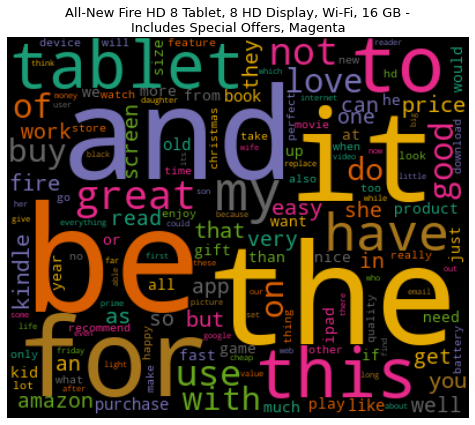

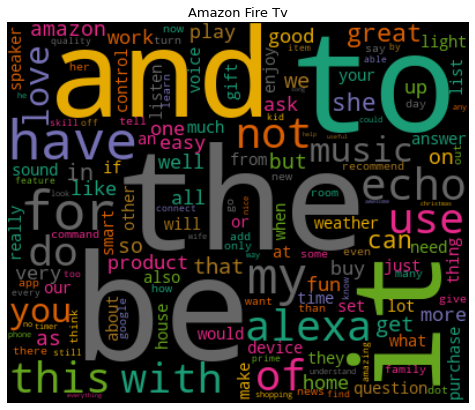

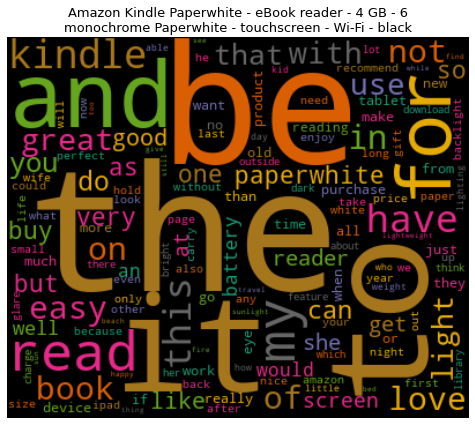

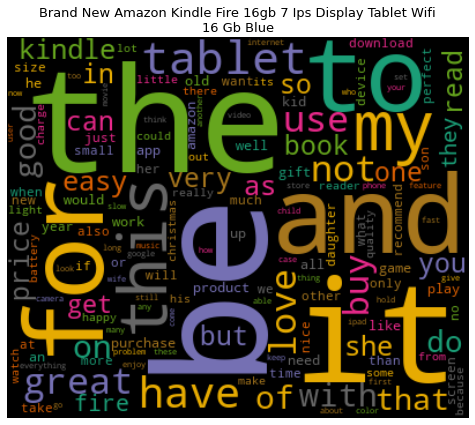

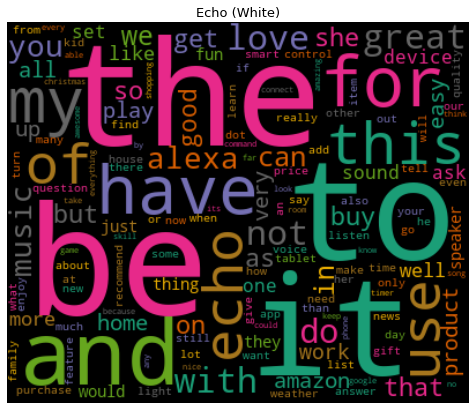

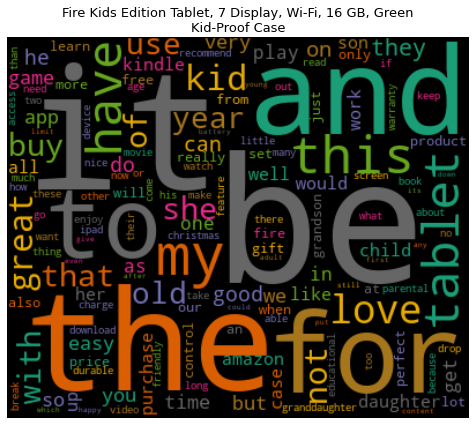

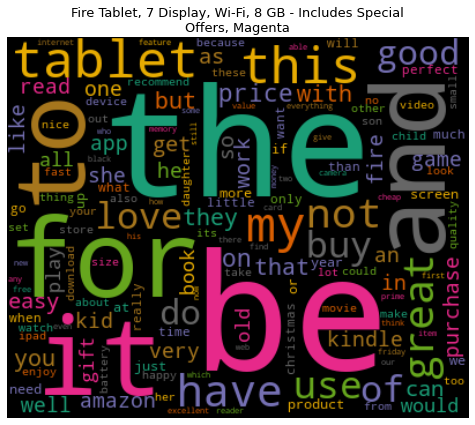

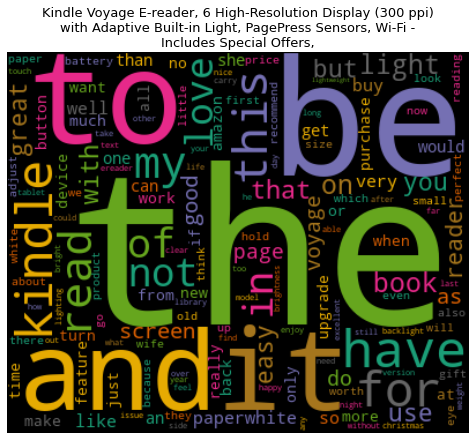

In [98]:
from wordcloud import WordCloud
from textwrap import wrap

def generate_wordcloud(data, title):
    wc=WordCloud(width=400,height=330, max_words=150, colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10,7))
    plt.imshow(wc,interpolation="bilinear")
    plt.axis("off")
    plt.title('\n'.join(wrap(title,60)),fontsize=13)
    plt.show()


for index, product in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[product].sort_values(ascending=False), product)

In [99]:
from textblob import TextBlob
df["polarity"]=df["lemmatized"].apply(lambda x: TextBlob(x).sentiment.polarity)

In [100]:
df["polarity"]

0        0.300000
1        0.700000
2        0.000000
3        0.393725
4        0.319318
           ...   
26063    0.500000
26064    0.411111
26065    0.512500
26066    0.175000
26067    0.000000
Name: polarity, Length: 26068, dtype: float64

In [101]:
df.iloc[df["polarity"].sort_values(ascending=False)]

,Unnamed: 0,Unnamed: 0.1,name,reviews.text,reviews.doRecommend,reviews.numHelpful,cleaned,lemmatized,polarity
1,1,1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",great for beginner or experienced person. Boug...,1,0,great for beginner or experienced person boug...,great for beginner or experienced person buy...,0.7
1,1,1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",great for beginner or experienced person. Boug...,1,0,great for beginner or experienced person boug...,great for beginner or experienced person buy...,0.7
1,1,1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",great for beginner or experienced person. Boug...,1,0,great for beginner or experienced person boug...,great for beginner or experienced person buy...,0.7
1,1,1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",great for beginner or experienced person. Boug...,1,0,great for beginner or experienced person boug...,great for beginner or experienced person buy...,0.7
1,1,1,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",great for beginner or experienced person. Boug...,1,0,great for beginner or experienced person boug...,great for beginner or experienced person buy...,0.7
...,...,...,...,...,...,...,...,...,...
0,0,0,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",This product so far has not disappointed. My c...,1,0,this product so far has not disappointed my c...,this product so far have not disappoint my c...,0.3
0,0,0,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",This product so far has not disappointed. My c...,1,0,this product so far has not disappointed my c...,this product so far have not disappoint my c...,0.3
0,0,0,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",This product so far has not disappointed. My c...,1,0,this product so far has not disappointed my c...,this product so far have not disappoint my c...,0.3
0,0,0,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",This product so far has not disappointed. My c...,1,0,this product so far has not disappointed my c...,this product so far have not disappoint my c...,0.3


In [102]:
print("3 Random Reviews with Highest Polarity:")

for index, review in enumerate(df.iloc[df["polarity"].sort_values(ascending=False)[:3].index]["reviews.text"]):
    print(f"Review {index +1}\n",review)

3 Random Reviews with Highest Polarity:
Review 1
 I got this tablet so I would not have to pack up my laptop when I went to my boyfriend's when I want to do my online class. This is perfect for that
Review 2
 This tablet is perfect for me, my kids, and for on the go. It is a brand I trust.
Review 3
 Perfect starter item for kids learning electronics.


In [103]:
print("3 Random Reviews with Lowest Polarity:")

for index, review in enumerate(df.iloc[df["polarity"].sort_values(ascending=True)[0:3].index]["reviews.text"]):
    print(f"Review {index+1}\n {review}")

3 Random Reviews with Lowest Polarity:
Review 1
 Bought it so my son would stop grabbing for my phone. Does what it needs to but battery life is horrible
Review 2
 My daughter wanted this product for herself. I got this unit based on the price and size.
Review 3
 I hate it, there is not any organization for the apps


In [104]:
df.iloc[df["polarity"].sort_values(ascending=False)[:3].index]["reviews.text"]

14361    I got this tablet so I would not have to pack ...
3838     This tablet is perfect for me, my kids, and fo...
16526    Perfect starter item for kids learning electro...
Name: reviews.text, dtype: object

In [105]:
df["polarity"].sort_values(ascending=False)[:3]

14361    1.0
3838     1.0
16526    1.0
Name: polarity, dtype: float64

In [106]:
df["polarity"].index

RangeIndex(start=0, stop=26068, step=1)

 plot polarities of reviews for each product and compare them

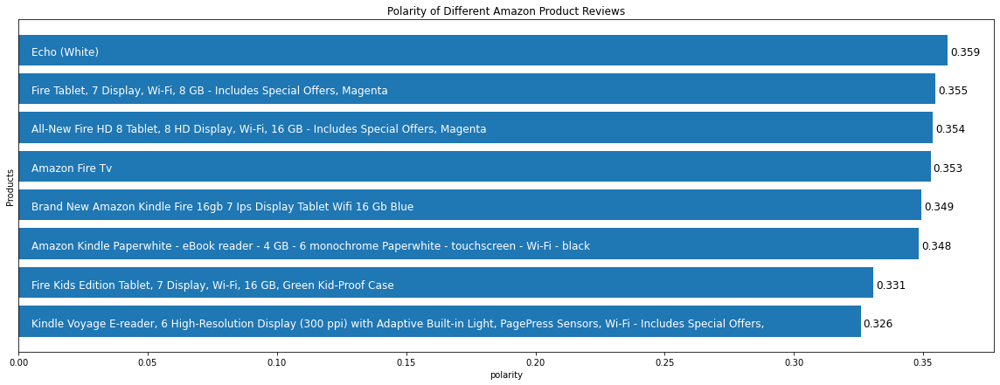

In [141]:
product_polarity_sorted=pd.DataFrame(df.groupby(by="name")['polarity'].mean().sort_values(ascending=True))

plt.figure(figsize=(20,7))
plt.xlabel("polarity")
plt.ylabel("Products")
plt.title('Polarity of Different Amazon Product Reviews')
polarity_graph=plt.barh(np.arange(len(product_polarity_sorted.index)), product_polarity_sorted["polarity"])

# Writing product names on bar
for bar, product in zip(polarity_graph,product_polarity_sorted.index):
    plt.text(0.005, bar.get_y()+bar.get_width(), "{}".format(product), va="center", fontsize=12, color="white")
    
## Writing polarity values on graph
for bar, polarity in zip(polarity_graph,product_polarity_sorted["polarity"]):
    plt.text(bar.get_width()+0.001,bar.get_y()+bar.get_width(),"%.3f"%polarity, va='center', fontsize=12,color="black")

plt.yticks([])
plt.show()



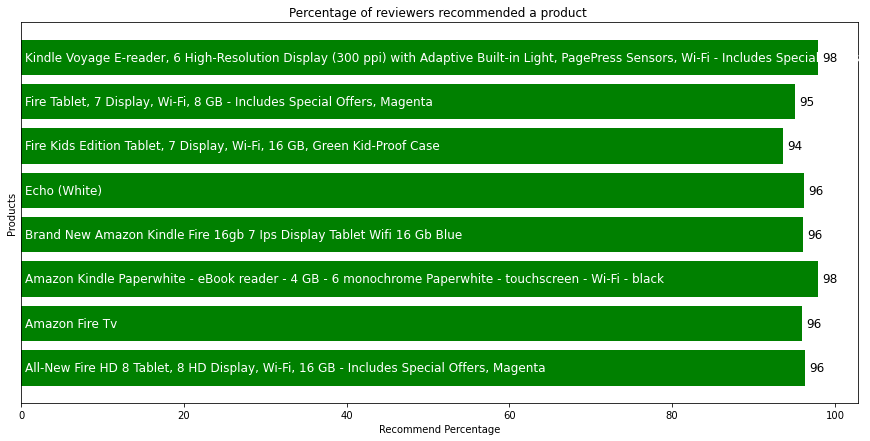

In [162]:
recommend_percentage=pd.DataFrame(df.groupby("name")["reviews.doRecommend"].sum()*100/df.groupby("name")["reviews.doRecommend"].count().sort_values(ascending=True))

plt.figure(figsize=(15,7))
plt.ylabel("Products")
plt.xlabel("Recommend Percentage")
plt.title("Percentage of reviewers recommended a product ")
recommend_graph=plt.barh(np.arange(len(recommend_percentage.index)), recommend_percentage["reviews.doRecommend"],color="green")

#writing product name on bar
for bar, product in zip(recommend_graph,recommend_percentage.index):
        plt.text(0.5, bar.get_y()+0.4,"{}".format(product), va="center", fontsize=12, color="white")
#writing recommedation percentage on graph
for bar, percentage in zip(recommend_graph, recommend_percentage["reviews.doRecommend"]):
    plt.text(bar.get_width()+0.5, bar.get_y()+0.4,"%2.f"%percentage, va="center", fontsize=12, color="black")
    
plt.yticks([])
plt.show()

 Fire Kids Edition Tablet has the lowest recommendation percentage. It’s reviews also have the lowest polarity. So, we can say that the polarity of reviews affects the chances of a product getting recommended

 readability of reviews

In [168]:
import textstat

df["dale_chall_score"]=df["reviews.text"].apply(lambda x : textstat.dale_chall_readability_score(x))
df["flesch_reading_score"]=df["reviews.text"].apply(lambda x: textstat.flesch_reading_ease(x))
df["gunning_fog"]=df["reviews.text"].apply(lambda x: textstat.gunning_fog(x))

In [180]:
print("Dale chall score of upvoted reviews :", df[df["reviews.numHelpful"]>1]["dale_chall_score"].mean())
print("Dale chall score of not upvoted reviews :", df[df["reviews.numHelpful"]<=1]["dale_chall_score"].mean())

print("\nflesch reading score of upvoted reviews:", df[df["reviews.numHelpful"]>1]["flesch_reading_score"].mean())
print("flesch reading score of not upvoted reviews: ", df[df["reviews.numHelpful"]<=1]["flesch_reading_score"].mean())

print("\ngunning fog score of upvoted reviews :", df[df["reviews.numHelpful"]>1]["gunning_fog"].mean())
print("gunning fog score of not upvoted reiews :", df[df["reviews.numHelpful"]<=1]["gunning_fog"].mean())

Dale chall score of upvoted reviews : 7.633191056910561
Dale chall score of not upvoted reviews : 7.451967788231436

flesch reading score of upvoted reviews: 84.26975609756074
flesch reading score of not upvoted reviews:  86.08486884069315

gunning fog score of upvoted reviews : 7.214918699186993
gunning fog score of not upvoted reiews : 6.506844203476289


 grade of education required to understand the review

In [185]:
df["text standard"]=df["reviews.text"].apply(lambda x: textstat.text_standard(x))

print("Text standard of upvoted reviews :", df[df["reviews.numHelpful"]>1]["text standard"].mode())
print("Text standard of not upvoted reviews :", df[df["reviews.numHelpful"]<=1]["text standard"].mode())

Text standard of upvoted reviews : 0    5th and 6th grade
dtype: object
Text standard of not upvoted reviews : 0    5th and 6th grade
dtype: object


reading time of reviews

In [187]:
df["reading_time"]=df["reviews.text"].apply(lambda x: textstat.reading_time(x))

print("Reading Time of upvoted reviews", df[df["reviews.numHelpful"]>1]["reading_time"].mean())
print("Reading time of not upvoted reviews", df[df["reviews.numHelpful"]<=1]["reading_time"].mean())

Reading Time of upvoted reviews 3.4555487804878027
Reading time of not upvoted reviews 1.792466911178448
